# 0. Install Packages, Import Libraries, Upload Data File

In [1]:
#Install packages
!pip install numpy
!pip install pandas
!pip install sklearn
!pip install --upgrade pip
!pip install unidecode
!pip install scipy
!pip install matplotlib
!pip install seaborn

#Import Libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import accuracy_score, mean_squared_error, roc_curve, auc

from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier

from sklearn.svm import SVC, LinearSVC 
from textwrap import wrap
np.random.seed(101) # We set a seed for reproducability

# To view plots inline
%matplotlib inline

from scipy import interp

sns.set_style('whitegrid')

#upload data file into pandas dataframe
kaggle_salary_original=pd.read_csv('Kaggle_Salary.csv')

kaggle_salary_original.head()

Requirement already up-to-date: pip in /anaconda3/lib/python3.6/site-packages (18.1)


/anaconda3/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2785: DtypeWarning: Columns (1,3,9,11,13,22,24,25,26,27,28,29,45,57,65,84,86,88,108,110,124,126,151,195,209,224,250,263,265,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,305,307,323,326,327,330,342,372,385,386,394,395) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,Unnamed: 0,Time from Start to Finish (seconds),Q1,Q1_OTHER_TEXT,Q2,Q3,Q4,Q5,Q6,Q6_OTHER_TEXT,...,Q50_Part_1,Q50_Part_2,Q50_Part_3,Q50_Part_4,Q50_Part_5,Q50_Part_6,Q50_Part_7,Q50_Part_8,Q50_OTHER_TEXT,index
0,0,Duration (in seconds),What is your gender? - Selected Choice,What is your gender? - Prefer to self-describe...,What is your age (# years)?,In which country do you currently reside?,What is the highest level of formal education ...,Which best describes your undergraduate major?...,Select the title most similar to your current ...,Select the title most similar to your current ...,...,What barriers prevent you from making your wor...,What barriers prevent you from making your wor...,What barriers prevent you from making your wor...,What barriers prevent you from making your wor...,What barriers prevent you from making your wor...,What barriers prevent you from making your wor...,What barriers prevent you from making your wor...,What barriers prevent you from making your wor...,What barriers prevent you from making your wor...,NaN
1,2,434,Male,-1,30-34,Indonesia,Bachelor’s degree,Engineering (non-computer focused),Other,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,0.0
2,3,718,Female,-1,30-34,United States of America,Master’s degree,"Computer science (software engineering, etc.)",Data Scientist,-1,...,NaN,Too time-consuming,NaN,NaN,NaN,NaN,NaN,NaN,-1,1.0
3,5,731,Male,-1,22-24,India,Master’s degree,Mathematics or statistics,Data Analyst,-1,...,NaN,Too time-consuming,NaN,NaN,Not enough incentives to share my work,NaN,NaN,NaN,-1,2.0
4,7,959,Male,-1,35-39,Chile,Doctoral degree,"Information technology, networking, or system ...",Other,1,...,Too expensive,NaN,NaN,NaN,NaN,I had never considered making my work easier f...,NaN,NaN,-1,3.0


# 1. Data Cleaning

In this analysis, I will try to understand how to predict a Data Scientists salary based on their reponse to the Kaggle survey. Questions of interest will be those that are objective, ie what is your gender, where do you live, what level of education do you have, what prorgamming languages do you use, what did you major in. While a number of the questions are subjective, they may be removed from the analysis because there are too many NaN values present in that question, are not deemed relevant, or are summarized in other qestions. To start this analysis, I try to understand what each column represents, and what type of data is in it (ie is it categorical or not...) by looking at the data.

Some categorical columns can be replaced with numbers. If a response is a range (ie I spend 20-30% of my time on X), then the mean was used to replace the range.

Some categorical data can be replaced by new columns that have a 0 or 1 for each category. This works better than ranking the categories, because the rank may have an impact on the future models, yet the numerical value assigned to that category may not be reflective its value. 

To handle NaN values in features deemed part of the analysis, the mode will be used to replace NaN values.


In [2]:
kaggle_salary_original.head()

,Unnamed: 0,Time from Start to Finish (seconds),Q1,Q1_OTHER_TEXT,Q2,Q3,Q4,Q5,Q6,Q6_OTHER_TEXT,...,Q50_Part_1,Q50_Part_2,Q50_Part_3,Q50_Part_4,Q50_Part_5,Q50_Part_6,Q50_Part_7,Q50_Part_8,Q50_OTHER_TEXT,index
0,0,Duration (in seconds),What is your gender? - Selected Choice,What is your gender? - Prefer to self-describe...,What is your age (# years)?,In which country do you currently reside?,What is the highest level of formal education ...,Which best describes your undergraduate major?...,Select the title most similar to your current ...,Select the title most similar to your current ...,...,What barriers prevent you from making your wor...,What barriers prevent you from making your wor...,What barriers prevent you from making your wor...,What barriers prevent you from making your wor...,What barriers prevent you from making your wor...,What barriers prevent you from making your wor...,What barriers prevent you from making your wor...,What barriers prevent you from making your wor...,What barriers prevent you from making your wor...,NaN
1,2,434,Male,-1,30-34,Indonesia,Bachelor’s degree,Engineering (non-computer focused),Other,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,0.0
2,3,718,Female,-1,30-34,United States of America,Master’s degree,"Computer science (software engineering, etc.)",Data Scientist,-1,...,NaN,Too time-consuming,NaN,NaN,NaN,NaN,NaN,NaN,-1,1.0
3,5,731,Male,-1,22-24,India,Master’s degree,Mathematics or statistics,Data Analyst,-1,...,NaN,Too time-consuming,NaN,NaN,Not enough incentives to share my work,NaN,NaN,NaN,-1,2.0
4,7,959,Male,-1,35-39,Chile,Doctoral degree,"Information technology, networking, or system ...",Other,1,...,Too expensive,NaN,NaN,NaN,NaN,I had never considered making my work easier f...,NaN,NaN,-1,3.0


In [3]:
from IPython.display import display
pd.options.display.max_columns = None
#pd.options.display.max_rows = None


1a) Start by analyzing responses for selected questions. For some very important features, replace missing values with the mode. Switching categorical data to numerical values. Do this for Q1, Q4, Q2, Q43, Q8, Q23, Q24, and Q25.

In [4]:
kaggle_salary_original.groupby('Q1').size()


Q1
Female                                     2380
Male                                      12866
Prefer not to say                           130
Prefer to self-describe                      53
What is your gender? - Selected Choice        1
dtype: int64

In [5]:
kaggle_salary_original.groupby('Q4').size()


Q4
Bachelor’s degree                                                                                                  4383
Doctoral degree                                                                                                    2522
I prefer not to answer                                                                                              130
Master’s degree                                                                                                    7286
No formal education past high school                                                                                135
Professional degree                                                                                                 384
Some college/university study without earning a bachelor’s degree                                                   589
What is the highest level of formal education that you have attained or plan to attain within the next 2 years?       1
dtype: int64

In [6]:
kaggle_salary_original.groupby('Q2').size()


Q2
18-21                          1363
22-24                          2894
25-29                          4278
30-34                          2819
35-39                          1637
40-44                           989
45-49                           602
50-54                           403
55-59                           222
60-69                           180
70-79                            26
80+                              16
What is your age (# years)?       1
dtype: int64

In [7]:
kaggle_salary_original['Q43'].value_counts()

0                                                                                                                   2862
0-10                                                                                                                2482
10-20                                                                                                               1556
20-30                                                                                                               1119
30-40                                                                                                                519
40-50                                                                                                                452
50-60                                                                                                                256
60-70                                                                                                                206
90-100                          

In [8]:
kaggle_salary_original['Q8'].value_counts()

0-1                                                               3879
1-2                                                               2826
5-10                                                              1973
2-3                                                               1965
3-4                                                               1308
4-5                                                               1145
10-15                                                             1123
15-20                                                              595
20-25                                                              271
30 +                                                               144
25-30                                                              124
How many years of experience do you have in your current role?       1
Name: Q8, dtype: int64

Notice that only 1% of the entries for Q8 are N/A values

In [9]:
kaggle_salary_original['Q23'].value_counts()

50% to 74% of my time                                                                  4036
25% to 49% of my time                                                                  3571
1% to 25% of my time                                                                   3013
75% to 99% of my time                                                                  2141
0% of my time                                                                           360
100% of my time                                                                         340
Approximately what percent of your time at work or school is spent actively coding?       1
Name: Q23, dtype: int64

In [10]:
kaggle_salary_original.groupby(['Q24']).size()

Q24
1-2 years                                               3785
10-20 years                                              902
20-30 years                                              239
3-5 years                                               3161
30-40 years                                               85
40+ years                                                 42
5-10 years                                              1781
< 1 year                                                2927
How long have you been writing code to analyze data?       1
I have never written code and I do not want to learn      26
I have never written code but I want to learn            493
dtype: int64

In [11]:
kaggle_salary_original.groupby(['Q25']).size()

Q25
1-2 years                                                                            3574
10-15 years                                                                           256
2-3 years                                                                            1664
20+ years                                                                             129
3-4 years                                                                             921
4-5 years                                                                             650
5-10 years                                                                            743
< 1 year                                                                             4194
For how many years have you used machine learning methods (at work or in school)?       1
I have never studied machine learning and I do not plan to                             59
I have never studied machine learning but plan to learn in the future                1225
dtype:

In [12]:
kaggle_salary_original.groupby(['Q26']).size()

Q26
Definitely not                                      1145
Definitely yes                                      3566
Do you consider yourself to be a data scientist?       1
Maybe                                               2869
Probably not                                        2231
Probably yes                                        3595
dtype: int64

In [13]:
#Replace the categorical data with numerical data. Take the mean if the categorical data is a range.
#If the category is the X+ then take X.
numeric_age_q2 = { "Q2": {"18-21":19.5, "22-24":23, "25-29":27, "30-34":32, "35-39":37, "40-44":42, "45-49":47, 
                          "50-54":52, "55-59":57, "60-69":64.5, "70-79":74.5,"80+":80}}

kaggle_salary_original.replace(numeric_age_q2, inplace = True)

numeric_q43 = { "Q43": {"0":0, "0-10":5, "10-20":15, "20-30":25, "30-40":35, "40-50":45, "50-60":55, 
                          "60-70":65, "70-80":75, "80-90":85, "90-100":95}}

kaggle_salary_original.replace(numeric_q43, inplace = True)

numeric_q46 = { "Q46": {"0":0, "0-10":5, "10-20":15, "20-30":25, "30-40":35, "40-50":45, "50-60":55, 
                          "60-70":65, "70-80":75, "80-90":85, "90-100":95}}

kaggle_salary_original.replace(numeric_q46, inplace = True)

numeric_q8 = { "Q8": {"0-1":0.5, "1-2":1.5, "2-3":2.5, "3-4":3.5, "4-5":4.5, "5-10":7.5, "10-15":12.5, 
                          "15-20":17.5, "20-25":22.5, "25-30":27.5, "30 +":30}}

kaggle_salary_original.replace(numeric_q8, inplace = True)

#Notice that only 1% of the entries for Q8 are N/A values, replace with 0.5 because it is the mode
kaggle_salary_original['Q8'].fillna(0.5, inplace=True)

numeric_q25 = { "Q25": {"1-2 years":1.5, "10-15 years":12.5, "2-3 years":2.5, 
                          "20+ years":20, "3-4 years":3.5, "4-5 years":4.5,
                       "5-10 years": 7.5, "< 1 year": 0.5, 
                        "I have never studied machine learning and I do not plan to":0,
                       "I have never studied machine learning but plan to learn in the future":0}}

kaggle_salary_original.replace(numeric_q25, inplace = True)

numeric_q23 = { "Q23": {"50% to 74% of my time":0.64, "25% to 49% of my time":0.37, "1% to 25% of my time":0.13, 
                          "75% to 99% of my time":0.87, "0% of my time":0, "100% of my time":1}}

kaggle_salary_original.replace(numeric_q23, inplace = True)

numeric_q24 = { "Q24": {"1-2 years":1.5, "10-20 years":15, "20-30 years":25, 
                          "3-5 years":4, "30-40 years":35, "5-10 years":7.5,
                       "< 1 year": 0.5, "I have never written code and I do not want to learn":0,
                       "I have never written code but I want to learn":0, "40+ years":40}}

kaggle_salary_original.replace(numeric_q24, inplace = True)


kaggle_salary_original.head()

,Unnamed: 0,Time from Start to Finish (seconds),Q1,Q1_OTHER_TEXT,Q2,Q3,Q4,Q5,Q6,Q6_OTHER_TEXT,Q7,Q7_OTHER_TEXT,Q8,Q9,Q10,Q11_Part_1,Q11_Part_2,Q11_Part_3,Q11_Part_4,Q11_Part_5,Q11_Part_6,Q11_Part_7,Q11_OTHER_TEXT,Q12_MULTIPLE_CHOICE,Q12_Part_1_TEXT,Q12_Part_2_TEXT,Q12_Part_3_TEXT,Q12_Part_4_TEXT,Q12_Part_5_TEXT,Q12_OTHER_TEXT,Q13_Part_1,Q13_Part_2,Q13_Part_3,Q13_Part_4,Q13_Part_5,Q13_Part_6,Q13_Part_7,Q13_Part_8,Q13_Part_9,Q13_Part_10,Q13_Part_11,Q13_Part_12,Q13_Part_13,Q13_Part_14,Q13_Part_15,Q13_OTHER_TEXT,Q14_Part_1,Q14_Part_2,Q14_Part_3,Q14_Part_4,Q14_Part_5,Q14_Part_6,Q14_Part_7,Q14_Part_8,Q14_Part_9,Q14_Part_10,Q14_Part_11,Q14_OTHER_TEXT,Q15_Part_1,Q15_Part_2,Q15_Part_3,Q15_Part_4,Q15_Part_5,Q15_Part_6,Q15_Part_7,Q15_OTHER_TEXT,Q16_Part_1,Q16_Part_2,Q16_Part_3,Q16_Part_4,Q16_Part_5,Q16_Part_6,Q16_Part_7,Q16_Part_8,Q16_Part_9,Q16_Part_10,Q16_Part_11,Q16_Part_12,Q16_Part_13,Q16_Part_14,Q16_Part_15,Q16_Part_16,Q16_Part_17,Q16_Part_18,Q16_OTHER_TEXT,Q17,Q17_OTHER_TEXT,Q18,Q18_OTHER_TEXT,Q19_Part_1,Q19_Part_2,Q19_Part_3,Q19_Part_4,Q19_Part_5,Q19_Part_6,Q19_Part_7,Q19_Part_8,Q19_Part_9,Q19_Part_10,Q19_Part_11,Q19_Part_12,Q19_Part_13,Q19_Part_14,Q19_Part_15,Q19_Part_16,Q19_Part_17,Q19_Part_18,Q19_Part_19,Q19_OTHER_TEXT,Q20,Q20_OTHER_TEXT,Q21_Part_1,Q21_Part_2,Q21_Part_3,Q21_Part_4,Q21_Part_5,Q21_Part_6,Q21_Part_7,Q21_Part_8,Q21_Part_9,Q21_Part_10,Q21_Part_11,Q21_Part_12,Q21_Part_13,Q21_OTHER_TEXT,Q22,Q22_OTHER_TEXT,Q23,Q24,Q25,Q26,Q27_Part_1,Q27_Part_2,Q27_Part_3,Q27_Part_4,Q27_Part_5,Q27_Part_6,Q27_Part_7,Q27_Part_8,Q27_Part_9,Q27_Part_10,Q27_Part_11,Q27_Part_12,Q27_Part_13,Q27_Part_14,Q27_Part_15,Q27_Part_16,Q27_Part_17,Q27_Part_18,Q27_Part_19,Q27_Part_20,Q27_OTHER_TEXT,Q28_Part_1,Q28_Part_2,Q28_Part_3,Q28_Part_4,Q28_Part_5,Q28_Part_6,Q28_Part_7,Q28_Part_8,Q28_Part_9,Q28_Part_10,Q28_Part_11,Q28_Part_12,Q28_Part_13,Q28_Part_14,Q28_Part_15,Q28_Part_16,Q28_Part_17,Q28_Part_18,Q28_Part_19,Q28_Part_20,Q28_Part_21,Q28_Part_22,Q28_Part_23,Q28_Part_24,Q28_Part_25,Q28_Part_26,Q28_Part_27,Q28_Part_28,Q28_Part_29,Q28_Part_30,Q28_Part_31,Q28_Part_32,Q28_Part_33,Q28_Part_34,Q28_Part_35,Q28_Part_36,Q28_Part_37,Q28_Part_38,Q28_Part_39,Q28_Part_40,Q28_Part_41,Q28_Part_42,Q28_Part_43,Q28_OTHER_TEXT,Q29_Part_1,Q29_Part_2,Q29_Part_3,Q29_Part_4,Q29_Part_5,Q29_Part_6,Q29_Part_7,Q29_Part_8,Q29_Part_9,Q29_Part_10,Q29_Part_11,Q29_Part_12,Q29_Part_13,Q29_Part_14,Q29_Part_15,Q29_Part_16,Q29_Part_17,Q29_Part_18,Q29_Part_19,Q29_Part_20,Q29_Part_21,Q29_Part_22,Q29_Part_23,Q29_Part_24,Q29_Part_25,Q29_Part_26,Q29_Part_27,Q29_Part_28,Q29_OTHER_TEXT,Q30_Part_1,Q30_Part_2,Q30_Part_3,Q30_Part_4,Q30_Part_5,Q30_Part_6,Q30_Part_7,Q30_Part_8,Q30_Part_9,Q30_Part_10,Q30_Part_11,Q30_Part_12,Q30_Part_13,Q30_Part_14,Q30_Part_15,Q30_Part_16,Q30_Part_17,Q30_Part_18,Q30_Part_19,Q30_Part_20,Q30_Part_21,Q30_Part_22,Q30_Part_23,Q30_Part_24,Q30_Part_25,Q30_OTHER_TEXT,Q31_Part_1,Q31_Part_2,Q31_Part_3,Q31_Part_4,Q31_Part_5,Q31_Part_6,Q31_Part_7,Q31_Part_8,Q31_Part_9,Q31_Part_10,Q31_Part_11,Q31_Part_12,Q31_OTHER_TEXT,Q32,Q32_OTHER,Q33_Part_1,Q33_Part_2,Q33_Part_3,Q33_Part_4,Q33_Part_5,Q33_Part_6,Q33_Part_7,Q33_Part_8,Q33_Part_9,Q33_Part_10,Q33_Part_11,Q33_OTHER_TEXT,Q34_Part_1,Q34_Part_2,Q34_Part_3,Q34_Part_4,Q34_Part_5,Q34_Part_6,Q34_OTHER_TEXT,Q35_Part_1,Q35_Part_2,Q35_Part_3,Q35_Part_4,Q35_Part_5,Q35_Part_6,Q35_OTHER_TEXT,Q36_Part_1,Q36_Part_2,Q36_Part_3,Q36_Part_4,Q36_Part_5,Q36_Part_6,Q36_Part_7,Q36_Part_8,Q36_Part_9,Q36_Part_10,Q36_Part_11,Q36_Part_12,Q36_Part_13,Q36_OTHER_TEXT,Q37,Q37_OTHER_TEXT,Q38_Part_1,Q38_Part_2,Q38_Part_3,Q38_Part_4,Q38_Part_5,Q38_Part_6,Q38_Part_7,Q38_Part_8,Q38_Part_9,Q38_Part_10,Q38_Part_11,Q38_Part_12,Q38_Part_13,Q38_Part_14,Q38_Part_15,Q38_Part_16,Q38_Part_17,Q38_Part_18,Q38_Part_19,Q38_Part_20,Q38_Part_21,Q38_Part_22,Q38_OTHER_TEXT,Q39_Part_1,Q39_Part_2,Q40,Q41_Part_1,Q41_Part_2,Q41_Part_3,Q42_Part_1,Q42_Part_2,Q42_Part_3,Q42_Part_4,Q42_Part_5,Q42_OTHER_TEXT,Q43,Q44_Part_1,Q44_Part_2,Q44_Part_3,Q44_Part_4,Q44_Part_5,Q44_Part_6,Q45_Part_1,Q45_P

1b) Now start to threshold to understand the columns that have very high volumes of NaN values. Remove columns with very high volumes of NaN values.

In [14]:
def percentage_na(x,a):
    if x/15429 >= a:
        return "reject"
    else:
        return "accept"

volume_na_original = pd.DataFrame(data = kaggle_salary_original.isna().sum(), columns = ['Vol_NA'])
volume_na_original['Percentage_NA'] = volume_na_original['Vol_NA'].apply( lambda x : x/15429 )
volume_na_original['Threshold_90_percent']=volume_na_original['Vol_NA'].apply( lambda x: percentage_na(x, 0.9))
volume_na_original['Threshold_95_percent'] =volume_na_original['Vol_NA'].apply(lambda x: percentage_na(x,0.95))
volume_na_original

,Vol_NA,Percentage_NA,Threshold_90_percent,Threshold_95_percent
Unnamed: 0,0,0.000000,accept,accept
Time from Start to Finish (seconds),0,0.000000,accept,accept
Q1,0,0.000000,accept,accept
Q1_OTHER_TEXT,0,0.000000,accept,accept
Q2,0,0.000000,accept,accept
Q3,0,0.000000,accept,accept
Q4,0,0.000000,accept,accept
Q5,135,0.008750,accept,accept
Q6,0,0.000000,accept,accept
Q6_OTHER_TEXT,0,0.000000,accept,accept


In [15]:
volume_na_original['Threshold_90_percent'].value_counts()

accept    206
reject    191
Name: Threshold_90_percent, dtype: int64

In [16]:
#remove features -> if the feature has 95% or more of its rows filled with NA values, remove that feature from the data set
#this will remove some of the unnecessary features from the analysis, and decrease the data set by 37%, making it easier to handle
reject_columns = volume_na_original[volume_na_original.Threshold_95_percent== "reject"].index.values

kaggle_salary_original = kaggle_salary_original.drop(reject_columns, axis=1)

In [17]:
#Replace NaN values for Q5 with the mode. Only 0.08% of the entries in Q5 are NaN, so replace with the mode.
kaggle_salary_original.groupby(['Q5']).size()

Q5
A business discipline (accounting, economics, finance, etc.)        1290
Computer science (software engineering, etc.)                       5937
Engineering (non-computer focused)                                  2469
Environmental science or geology                                     175
Fine arts or performing arts                                          59
Humanities (history, literature, philosophy, etc.)                   210
I never declared a major                                              68
Information technology, networking, or system administration         642
Mathematics or statistics                                           2074
Medical or life sciences (biology, chemistry, medicine, etc.)        615
Other                                                                499
Physics or astronomy                                                 843
Social sciences (anthropology, psychology, sociology, etc.)          413
Which best describes your undergraduate major? -

In [18]:
kaggle_salary_original['Q5'].fillna('Computer science (software engineering, etc.)', inplace=True)

In [19]:
#now see how many of the remining columns have high volumes of NaN entries. 
kaggle_salary_original.isna().sum()

Unnamed: 0                                 0
Time from Start to Finish (seconds)        0
Q1                                         0
Q1_OTHER_TEXT                              0
Q2                                         0
Q3                                         0
Q4                                         0
Q5                                         0
Q6                                         0
Q6_OTHER_TEXT                              0
Q7                                         0
Q7_OTHER_TEXT                              0
Q8                                         0
Q9                                         0
Q10                                      292
Q11_Part_1                              7966
Q11_Part_2                             11186
Q11_Part_3                             11278
Q11_Part_4                              9705
Q11_Part_5                             11845
Q11_Part_6                             12914
Q11_OTHER_TEXT                             0
Q12_MULTIP

In [20]:
#remove the Other_Text columns because they never contain helpful information
Other_Text = [col for col in kaggle_salary_original.columns if 'OTHER_TEXT' in col]
kaggle_salary_original = kaggle_salary_original.drop(Other_Text, axis=1)

In [21]:
#Do some more thresholding! there are still a lot of comuns with high voluems of NaN values.
volume_na_v2 = pd.DataFrame(data = kaggle_salary_original.isna().sum(), columns = ['Vol_NA'])
volume_na_v2['Percentage_NA'] = volume_na_v2['Vol_NA'].apply( lambda x : x/15429 )

volume_na_v2['Threshold_25_percent']=volume_na_v2['Vol_NA'].apply( lambda x: percentage_na(x, 0.25))
volume_na_v2['Threshold_30_percent']=volume_na_v2['Vol_NA'].apply( lambda x: percentage_na(x, 0.30))
volume_na_v2

,Vol_NA,Percentage_NA,Threshold_25_percent,Threshold_30_percent
Unnamed: 0,0,0.000000,accept,accept
Time from Start to Finish (seconds),0,0.000000,accept,accept
Q1,0,0.000000,accept,accept
Q2,0,0.000000,accept,accept
Q3,0,0.000000,accept,accept
Q4,0,0.000000,accept,accept
Q5,0,0.000000,accept,accept
Q6,0,0.000000,accept,accept
Q7,0,0.000000,accept,accept
Q8,0,0.000000,accept,accept


Because there are still many features where many of the rows have N/A's present, a comprehensive review of what I would like to achieve with this analysis and the relevance of the remaining columns was conducted. If a question could be summarized (such as which of the above languages do you use the most) was available, this 'summary' column was  leveraged. It was determined that features relating to skills, programming languages, machine learning uses,d and demographic information would be included. The remainig rows that would be removed were therefore opinion questions, subjective questions (such as what activites do you do at work), questions relations to IDE's, notebooks, and cloud computing services and products used, machine learning services and products, relational database products, big data and analytics products, where to find public data, online platforms used to take courses on, favorite media sources that report on data science topics, practices at the workplace and best practices while working, bias in data, and barriers to reuse and reprocude work. While these questions are important to understand the current state of the Data Analytics Industry, many had missing values of upwards of 50%, and so it would be hard to infer how to handle these (we can't simply include 0's or the mode necessarily). This is compounded by the fact that not every person who answered the survey was sent all questions. Therefore, the questions that will remain in the dataset will be more directly related to programming languages used, educational level, education major, and demographics, and have a high number of filled in answers. The mode will be used to replace NaN values in the remaining columns.

In [22]:
kaggle_new = kaggle_salary_original[['Q1', 'Q2', 'Q3', 'Q4', 'Q5', 'Q6', 'Q7', 'Q8', 'Q9', 'Q10', 'Q12_MULTIPLE_CHOICE', 
               'Q17', 'Q20', 'Q22', 'Q23', 'Q24', 'Q25', 'Q26', 'Q32', 'Q34_Part_1', 'Q34_Part_2', 
               'Q34_Part_3', 'Q34_Part_4', 'Q34_Part_5', 'Q34_Part_6', 'Q35_Part_1', 'Q35_Part_2',
                'Q35_Part_3', 'Q35_Part_4', 'Q35_Part_5', 'Q35_Part_6', 'Q37', 'Q40', 
               'index']].copy()
kaggle_new=kaggle_new.iloc[1:]

In [23]:
kaggle_new.dtypes

Q1                      object
Q2                      object
Q3                      object
Q4                      object
Q5                      object
Q6                      object
Q7                      object
Q8                      object
Q9                      object
Q10                     object
Q12_MULTIPLE_CHOICE     object
Q17                     object
Q20                     object
Q22                     object
Q23                     object
Q24                     object
Q25                     object
Q26                     object
Q32                     object
Q34_Part_1              object
Q34_Part_2              object
Q34_Part_3              object
Q34_Part_4              object
Q34_Part_5              object
Q34_Part_6              object
Q35_Part_1              object
Q35_Part_2              object
Q35_Part_3              object
Q35_Part_4              object
Q35_Part_5              object
Q35_Part_6              object
Q37                     object
Q40     

1c) Now determine how to handle the NaN values for the remaining columns. First investigate how many NaN values are present in each.

In [24]:
kaggle_new.isna().sum()

Q1                        0
Q2                        0
Q3                        0
Q4                        0
Q5                        0
Q6                        0
Q7                        0
Q8                        0
Q9                        0
Q10                     292
Q12_MULTIPLE_CHOICE    1572
Q17                    4341
Q20                    5769
Q22                    6243
Q23                    1968
Q24                    1988
Q25                    2014
Q26                    2023
Q32                    5125
Q34_Part_1             3664
Q34_Part_2             3664
Q34_Part_3             3664
Q34_Part_4             3664
Q34_Part_5             3664
Q34_Part_6             3664
Q35_Part_1             3785
Q35_Part_2             3785
Q35_Part_3             3785
Q35_Part_4             3785
Q35_Part_5             3785
Q35_Part_6             3785
Q37                    8140
Q40                    3763
index                     0
dtype: int64

Notice that Q20, Q22, and Q37 have somewhat high volumes of NaN values.
Investigate the distribution of the entries for these columns.

In [25]:
#For Q20, investigate the number of NaN rows that occur when Q_19_Part_18 = 'None'
kaggle_salary_original[(kaggle_salary_original['Q19_Part_18'].notna()) & (kaggle_salary_original['Q20'].isna())].Q19_Part_18.count()


1976

Because only 30% of the NaN values in Q20 are attributed to Q19_Part_18 = None, just replace all with the mode. We will make the assumption that they would agree with the mode.

In [26]:
#For question 22, investigate the number of NaN rows that occur because Q21_Part_12 = None
kaggle_salary_original[(kaggle_salary_original['Q21_Part_12'].notna()) & (kaggle_salary_original['Q22'].isna())].Q21_Part_12.count()


1276

Because only 20% of the NaN values in Q22 are attributed to Q21_Part_12 = None, just replace all with the mode. We will make the assumption that they would agree with the mode.

In [27]:
#For question 37, investigate the number of NaN rows that occur because Q36_Part_12 = None
kaggle_salary_original[(kaggle_salary_original['Q36_Part_12'].notna()) & (kaggle_salary_original['Q37'].isna())].Q36_Part_12.count()


1373

Because only 16% of the NaN values in Q37 are attributed to Q36_Part_12 = None, just replace all with the mode. We will make the assumption that they would agree with the mode.

In [28]:

#replace NaN values with mode for all columns

from statistics import mode

for column in kaggle_new.columns:
    if kaggle_new[column].isna().sum().any() > 0:
        kaggle_new[column].fillna(kaggle_new[column].mode()[0], inplace=True)
       

In [29]:
kaggle_new.head()

,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9,Q10,Q12_MULTIPLE_CHOICE,Q17,Q20,Q22,Q23,Q24,Q25,Q26,Q32,Q34_Part_1,Q34_Part_2,Q34_Part_3,Q34_Part_4,Q34_Part_5,Q34_Part_6,Q35_Part_1,Q35_Part_2,Q35_Part_3,Q35_Part_4,Q35_Part_5,Q35_Part_6,Q37,Q40,index
1,Male,32,Indonesia,Bachelor’s degree,Engineering (non-computer focused),Other,Manufacturing/Fabrication,7.5,18668,No (we do not use ML methods),"Basic statistical software (Microsoft Excel, G...",Python,Scikit-Learn,Matplotlib,0.13,0.0,0.0,Definitely not,Numerical Data,10,20,10,20,0,10,0,0,0,0,0,0,Coursera,Independent projects are equally important as ...,0.0
2,Female,32,United States of America,Master’s degree,"Computer science (software engineering, etc.)",Data Scientist,I am a student,0.5,2726,I do not know,Local or hosted development environments (RStu...,Java,Scikit-Learn,ggplot2,0.87,7.5,0.5,Definitely yes,Time Series Data,2,3,20,50,20,0,0,0,0,100,0,0,DataCamp,Independent projects are equally important as ...,1.0
3,Male,23,India,Master’s degree,Mathematics or statistics,Data Analyst,I am a student,0.5,682,I do not know,"Advanced statistical software (SPSS, SAS, etc.)",SQL,Scikit-Learn,Matplotlib,0.87,7.5,2.5,Maybe,Numerical Data,10,10,20,10,20,23,20,40,20,20,0,0,Coursera,Independent projects are slightly more importa...,2.0
4,Male,37,Chile,Doctoral degree,"Information technology, networking, or system ...",Other,Academics/Education,12.5,11957,No (we do not use ML methods),"Basic statistical software (Microsoft Excel, G...",Python,Scikit-Learn,Matplotlib,0.37,0.5,0.5,Probably not,Numerical Data,0,30,50,0,0,20,50,20,30,0,0,0,Coursera,Independent projects are much more important t...,3.0
5,Male,19.5,India,Master’s degree,"Information technology, networking, or system ...",Other,Other,0.5,2696,"We recently started using ML methods (i.e., mo...",Local or hosted development environments (RStu...,Python,Keras,Matplotlib,0.87,0.5,0.5,Probably not,Image Data,20,30,20,20,5,5,75,5,20,0,0,0,Udacity,Independent projects are slightly more importa...,4.0


In [30]:
#keep a version of this table for data visualization (step 2!)

data_vis_df = kaggle_new.copy()

In [31]:
#double check to make sure there are no NaN values present in data
kaggle_new.isna().sum()

Q1                     0
Q2                     0
Q3                     0
Q4                     0
Q5                     0
Q6                     0
Q7                     0
Q8                     0
Q9                     0
Q10                    0
Q12_MULTIPLE_CHOICE    0
Q17                    0
Q20                    0
Q22                    0
Q23                    0
Q24                    0
Q25                    0
Q26                    0
Q32                    0
Q34_Part_1             0
Q34_Part_2             0
Q34_Part_3             0
Q34_Part_4             0
Q34_Part_5             0
Q34_Part_6             0
Q35_Part_1             0
Q35_Part_2             0
Q35_Part_3             0
Q35_Part_4             0
Q35_Part_5             0
Q35_Part_6             0
Q37                    0
Q40                    0
index                  0
dtype: int64

To do this, I have leveraged "One Hot Encoding", where I convert each selected response to its own new column and populate it with 1's and 0's based on the response. As an example, I now have a 'Female' column, where a 1 represents the response female and a 0 represents not female. I chose to do this rather than encode each response with a numerical value (because then, for example, the regression models would handle a  Female as value 1, and a Male as value 2, when we can't really rank them!).

Will do "One Hot Encoding" for Q1, Q3, Q4, Q5, Q6, Q7, Q10, Q12, Q17, Q20, Q22, Q26, Q32, Q37, and Q40

In [32]:
#This method creates a new feature, which and uses a binary representation for the original responses.
kaggle_new = pd.get_dummies(kaggle_new, columns = ["Q1", "Q3", "Q4", "Q5", "Q6", "Q7", "Q10", "Q12_MULTIPLE_CHOICE", "Q17", "Q20", "Q22", "Q26", 
                                      "Q32", "Q37", "Q40"], prefix = ['gender', 'country', 'education', 'major', 'title',
                                                                     'industry', 'ML_incorporated_work', 'primary_tool', 'language', 
                                                                     'ML_Library', 'data_vis_library', 'Data_scientist?', 'data_type',
                                                                     'online_platform', 'demonstrate_expertise'])

In [33]:
kaggle_new.dtypes


Q2                                                                                                    object
Q8                                                                                                    object
Q9                                                                                                    object
Q23                                                                                                  float64
Q24                                                                                                  float64
Q25                                                                                                  float64
Q34_Part_1                                                                                            object
Q34_Part_2                                                                                            object
Q34_Part_3                                                                                            object
Q34_Part_4         

In [34]:
kaggle_new

,Q2,Q8,Q9,Q23,Q24,Q25,Q34_Part_1,Q34_Part_2,Q34_Part_3,Q34_Part_4,Q34_Part_5,Q34_Part_6,Q35_Part_1,Q35_Part_2,Q35_Part_3,Q35_Part_4,Q35_Part_5,Q35_Part_6,index,gender_Female,gender_Male,gender_Prefer not to say,gender_Prefer to self-describe,country_Argentina,country_Australia,country_Austria,country_Bangladesh,country_Belarus,country_Belgium,country_Brazil,country_Canada,country_Chile,country_China,country_Colombia,country_Czech Republic,country_Denmark,country_Egypt,country_Finland,country_France,country_Germany,country_Greece,country_Hong Kong (S.A.R.),country_Hungary,country_I do not wish to disclose my location,country_India,country_Indonesia,"country_Iran, Islamic Republic of...",country_Ireland,country_Israel,country_Italy,country_Japan,country_Kenya,country_Malaysia,country_Mexico,country_Morocco,country_Netherlands,country_New Zealand,country_Nigeria,country_Norway,country_Other,country_Pakistan,country_Peru,country_Philippines,country_Poland,country_Portugal,country_Republic of Korea,country_Romania,country_Russia,country_Singapore,country_South Africa,country_South Korea,country_Spain,country_Sweden,country_Switzerland,country_Thailand,country_Tunisia,country_Turkey,country_Ukraine,country_United Kingdom of Great Britain and Northern Ireland,country_United States of America,country_Viet Nam,education_Bachelor’s degree,education_Doctoral degree,education_I prefer not to answer,education_Master’s degree,education_No formal education past high school,education_Professional degree,education_Some college/university study without earning a bachelor’s degree,"major_A business discipline (accounting, economics, finance, etc.)","major_Computer science (software engineering, etc.)",major_Engineering (non-computer focused),major_Environmental science or geology,major_Fine arts or performing arts,"major_Humanities (history, literature, philosophy, etc.)",major_I never declared a major,"major_Information technology, networking, or system administration",major_Mathematics or statistics,"major_Medical or life sciences (biology, chemistry, medicine, etc.)",major_Other,major_Physics or astronomy,"major_Social sciences (anthropology, psychology, sociology, etc.)",title_Business Analyst,title_Chief Officer,title_Consultant,title_DBA/Database Engineer,title_Data Analyst,title_Data Engineer,title_Data Journalist,title_Data Scientist,title_Developer Advocate,title_Manager,title_Marketing Analyst,title_Other,title_Principal Investigator,title_Product/Project Manager,title_Research Assistant,title_Research Scientist,title_Salesperson,title_Software Engineer,title_Statistician,title_Student,industry_Academics/Education,industry_Accounting/Finance,industry_Broadcasting/Communications,industry_Computers/Technology,industry_Energy/Mining,industry_Government/Public Service,industry_Hospitality/Entertainment/Sports,industry_I am a student,industry_Insurance/Risk Assessment,industry_Manufacturing/Fabrication,industry_Marketing/CRM,industry_Medical/Pharmaceutical,industry_Military/Security/Defense,industry_Non-profit/Service,industry_Online Business/Internet-based Sales,industry_Online Service/Internet-based Services,industry_Other,industry_Retail/Sales,industry_Shipping/Transportation,ML_incorporated_work_I do not know,ML_incorporated_work_No (we do not use ML methods),ML_incorporated_work_We are exploring ML methods (and may one day put a model into production),"ML_incorporated_work_We have well established ML methods (i.e., models in production for more than 2 years)","ML_incorporated_work_We recently started using ML methods (i.e., models in production for less than 2 years)",ML_incorporated_work_We use ML methods for generating insights (but do not put working models into production),"primary_tool_Advanced statistical software (SPSS, SAS, etc.)","primary_tool_Basic statistical software (Microsoft Excel, Google Sheets, etc.)","primary_tool_Business intelligence software (Salesforce, Tableau, Spotfire, etc.)","primary_tool_Cloud-based data soft

## 2. Exploratory Data Analysis

In this section, I will visualize the trends in the data using three graphical figures.
Then, I will visualize the order of importance of each feature using a correlation matrix.
I will use the data prepared in the data cleaning procedure, so some features from the initial survey will not be examined.

2a) Three graphical figures to visualize trends in the data.

In [35]:
country_of_residence= pd.DataFrame( data = data_vis_df.groupby('Q3').size(), columns = ['Num_Respondents'] )
country_of_residence = country_of_residence.sort_values(['Num_Respondents'], ascending=[True])
country_of_residence['country'] = country_of_residence.index

correct = { "country": {"Iran, Islamic Republic of...":'Iran', "United Kingdom of Great Britain and Northern Ireland":'UK', 
                             "United States of America":'USA'}}

country_of_residence.replace(correct, inplace = True)


country_of_residence

,Num_Respondents,country
Q3,,
Tunisia,35,Tunisia
Morocco,35,Morocco
Austria,40,Austria
Hong Kong (S.A.R.),43,Hong Kong (S.A.R.)
Thailand,45,Thailand
Republic of Korea,45,Republic of Korea
Czech Republic,48,Czech Republic
Philippines,49,Philippines
Romania,51,Romania


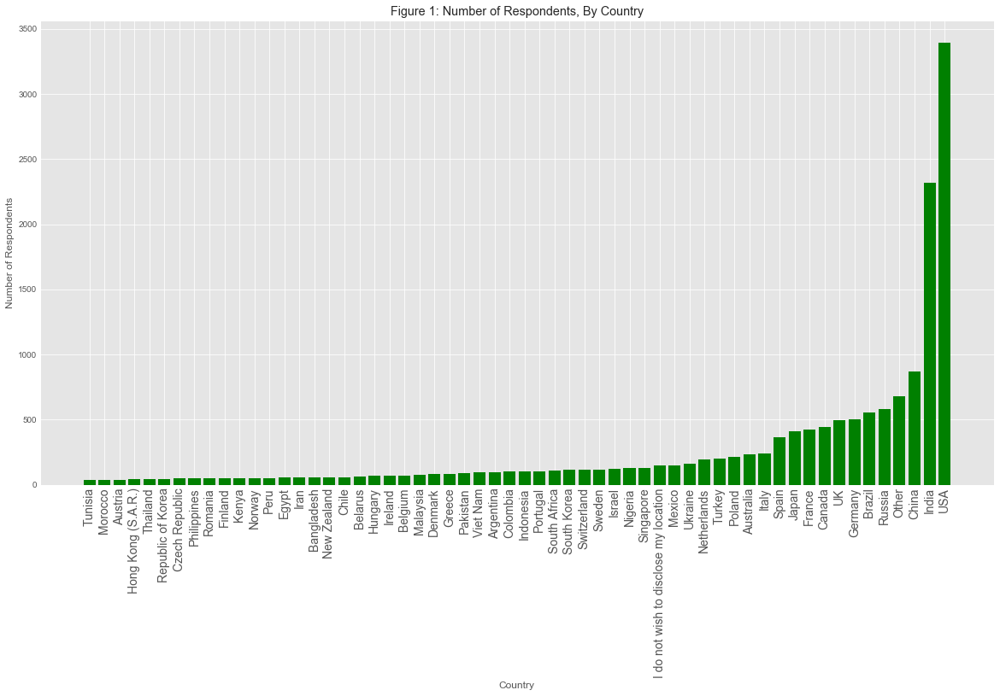

In [173]:
#Graphical Figure 1: Which country do the respondents reside in?

%matplotlib inline
plt.style.use('ggplot')

f, ax = plt.subplots(figsize=(20,10))

plt.bar(country_of_residence['country'], country_of_residence['Num_Respondents'], color='green')
plt.xlabel("Country")
plt.ylabel("Number of Respondents")
plt.title("Figure 1: Number of Respondents, By Country")
plt.xticks(rotation = 90)
plt.xticks(size=14)
#plt.get_xticklabels().set_fontsize(12)

f.savefig('by_country.png')

plt.show()

As is evident form this graph, a majority of the respondents are from the United States, followed by India. This could indicate that responses will be heavily influenced by these two populations. The country where a person works can provide an indication of compensation, as salaries are different in different countries. 

In [37]:
#Next, investigate respondents education level
edu= pd.DataFrame( data = data_vis_df.groupby('Q4').size(), columns = ['Num_Respondents'] )
edu = edu.sort_values(['Num_Respondents'], ascending=[True])
edu['Education_Level'] = edu.index
edu

,Num_Respondents,Education_Level
Q4,,
I prefer not to answer,130,I prefer not to answer
No formal education past high school,135,No formal education past high school
Professional degree,384,Professional degree
Some college/university study without earning a bachelor’s degree,589,Some college/university study without earning ...
Doctoral degree,2522,Doctoral degree
Bachelor’s degree,4383,Bachelor’s degree
Master’s degree,7286,Master’s degree


  agg_filter: a filter function, which takes a (m, n, 3) float array and a dpi value, and returns a (m, n, 3) array 
  alpha: float (0.0 transparent through 1.0 opaque) 
  animated: bool 
  backgroundcolor: any matplotlib color 
  bbox: FancyBboxPatch prop dict 
  clip_box: a :class:`matplotlib.transforms.Bbox` instance 
  clip_on: bool 
  clip_path: [ (:class:`~matplotlib.path.Path`, :class:`~matplotlib.transforms.Transform`) | :class:`~matplotlib.patches.Patch` | None ] 
  color: any matplotlib color 
  contains: a callable function 
  family or fontfamily or fontname or name: [FONTNAME | 'serif' | 'sans-serif' | 'cursive' | 'fantasy' | 'monospace' ] 
  figure: a `.Figure` instance 
  fontproperties or font_properties: a :class:`matplotlib.font_manager.FontProperties` instance 
  gid: an id string 
  horizontalalignment or ha: [ 'center' | 'right' | 'left' ] 
  label: object 
  linespacing: float (multiple of font size) 
  multialignment or ma: ['left' | 'right' | 'center' ] 
  path_

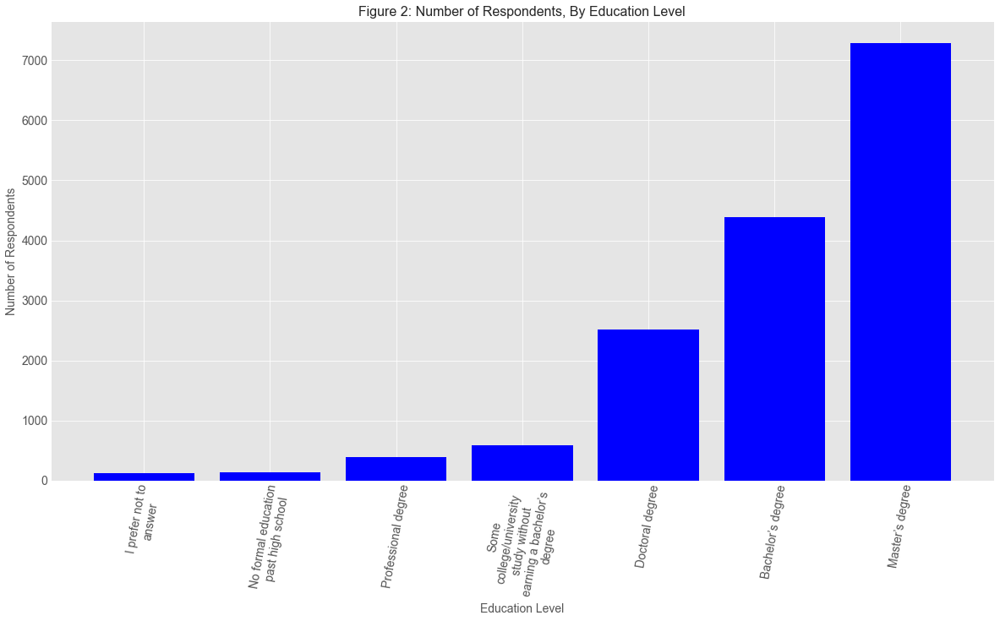

In [174]:
#Graphical Figure 2: What level of Education do the Respondents posses?

%matplotlib inline
plt.style.use('ggplot')

f, ax = plt.subplots(figsize=(20,10))

plt.bar(edu['Education_Level'], edu['Num_Respondents'], color='blue')

labels = ['\n'.join(wrap(l,20)) for l in edu['Education_Level']]

plt.xlabel("Education Level", size=14)
plt.ylabel("Number of Respondents", size=14)
plt.title("Figure 2: Number of Respondents, By Education Level", size=16)
plt.xticks(rotation = 80)
plt.xticks(size=14)
plt.yticks(size=14)

plt.setp(ax.set_xticklabels(labels))

f.savefig('by_edu.png')

plt.show()


As we can see from this figure, most of the respondents have a Master's degree. Good thing I'm also getting a Master's degree! Education level can influence salary.

In [39]:
#Finally, investigate job description of respondents
job_title= pd.DataFrame( data = data_vis_df.groupby('Q6').size(), columns = ['Num_Respondents'] )
job_title = job_title.sort_values(['Num_Respondents'], ascending=[True])
job_title['Job_Title'] = job_title.index
job_title

,Num_Respondents,Job_Title
Q6,,
Data Journalist,10,Data Journalist
Salesperson,80,Salesperson
Principal Investigator,83,Principal Investigator
Developer Advocate,85,Developer Advocate
Marketing Analyst,87,Marketing Analyst
DBA/Database Engineer,117,DBA/Database Engineer
Statistician,180,Statistician
Chief Officer,251,Chief Officer
Product/Project Manager,329,Product/Project Manager


  agg_filter: a filter function, which takes a (m, n, 3) float array and a dpi value, and returns a (m, n, 3) array 
  alpha: float (0.0 transparent through 1.0 opaque) 
  animated: bool 
  backgroundcolor: any matplotlib color 
  bbox: FancyBboxPatch prop dict 
  clip_box: a :class:`matplotlib.transforms.Bbox` instance 
  clip_on: bool 
  clip_path: [ (:class:`~matplotlib.path.Path`, :class:`~matplotlib.transforms.Transform`) | :class:`~matplotlib.patches.Patch` | None ] 
  color: any matplotlib color 
  contains: a callable function 
  family or fontfamily or fontname or name: [FONTNAME | 'serif' | 'sans-serif' | 'cursive' | 'fantasy' | 'monospace' ] 
  figure: a `.Figure` instance 
  fontproperties or font_properties: a :class:`matplotlib.font_manager.FontProperties` instance 
  gid: an id string 
  horizontalalignment or ha: [ 'center' | 'right' | 'left' ] 
  label: object 
  linespacing: float (multiple of font size) 
  multialignment or ma: ['left' | 'right' | 'center' ] 
  path_

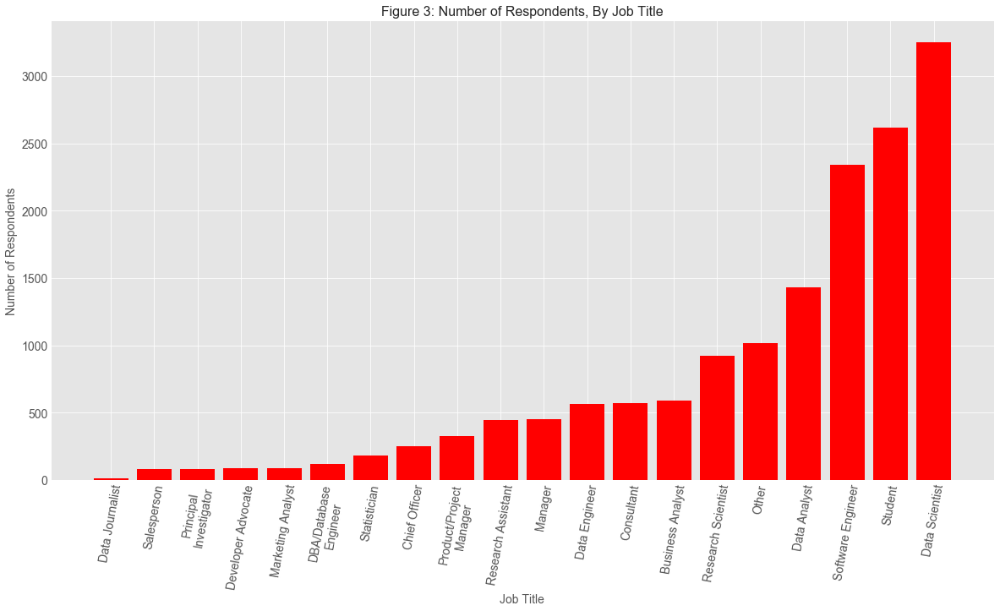

In [175]:
#Graphical Figure 3: What Job Descriptions do Respondents Have?

%matplotlib inline
plt.style.use('ggplot')

f, ax = plt.subplots(figsize=(20,10))

plt.bar(job_title['Job_Title'], job_title['Num_Respondents'], color='red')

labels = ['\n'.join(wrap(l,20)) for l in job_title['Job_Title']]

plt.xlabel("Job Title", size=14)
plt.ylabel("Number of Respondents", size=14)
plt.title("Figure 3: Number of Respondents, By Job Title", size=16)
plt.xticks(rotation = 80)
plt.xticks(size=14)
plt.yticks(size=14)

plt.setp(ax.set_xticklabels(labels))

f.savefig('by_job.png')


plt.show()

As we can see, most of the respondents hold the job title data scientis. This indicates that most of the people who are doing this sort of analytics are data scientists. Job title could point to an indication salary level as well.

2b) Now I will use a correlation matrix to visualize the order of feature importance. First we will try to create and interpret a correlation matrix using the hot-encoded version of our data. However, one trade off is the dataframe with the one hot encoding handling of the features has 243 columns! Afterwards, we can try using ranking to handle the categorical data, and create a correlation matrix from that. 

In [41]:
#convert kaggle_new to numeric dataframe for analysis
kaggle_new_numeric = kaggle_new.apply(pd.to_numeric)
kaggle_new_numeric.dtypes

Q2                                                                                                   float64
Q8                                                                                                   float64
Q9                                                                                                     int64
Q23                                                                                                  float64
Q24                                                                                                  float64
Q25                                                                                                  float64
Q34_Part_1                                                                                           float64
Q34_Part_2                                                                                           float64
Q34_Part_3                                                                                           float64
Q34_Part_4         

In [42]:
#Try creating correlation matrix using the one hot encoding dataframe. 
corr_kaggle_new_numeric = kaggle_new_numeric.corr()
corr_kaggle_new_numeric.style.background_gradient()

We can see that features Q2, Q8, Q24, Q25, residing in the USA, being the Chief Officer, and having well established ML methods correlate positively with income value. However, we also want to know more generally if location and job title represents a correlation to income rather than just specific attributes of that feature. Therefore, we manipulate our data to have label encoding rather than one-hot encoding.

In [43]:
data_vis_df.dtypes

Q1                      object
Q2                      object
Q3                      object
Q4                      object
Q5                      object
Q6                      object
Q7                      object
Q8                      object
Q9                      object
Q10                     object
Q12_MULTIPLE_CHOICE     object
Q17                     object
Q20                     object
Q22                     object
Q23                    float64
Q24                    float64
Q25                    float64
Q26                     object
Q32                     object
Q34_Part_1              object
Q34_Part_2              object
Q34_Part_3              object
Q34_Part_4              object
Q34_Part_5              object
Q34_Part_6              object
Q35_Part_1              object
Q35_Part_2              object
Q35_Part_3              object
Q35_Part_4              object
Q35_Part_5              object
Q35_Part_6              object
Q37                     object
Q40     

In [44]:
data_vis_df.head()

,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9,Q10,Q12_MULTIPLE_CHOICE,Q17,Q20,Q22,Q23,Q24,Q25,Q26,Q32,Q34_Part_1,Q34_Part_2,Q34_Part_3,Q34_Part_4,Q34_Part_5,Q34_Part_6,Q35_Part_1,Q35_Part_2,Q35_Part_3,Q35_Part_4,Q35_Part_5,Q35_Part_6,Q37,Q40,index
1,Male,32,Indonesia,Bachelor’s degree,Engineering (non-computer focused),Other,Manufacturing/Fabrication,7.5,18668,No (we do not use ML methods),"Basic statistical software (Microsoft Excel, G...",Python,Scikit-Learn,Matplotlib,0.13,0.0,0.0,Definitely not,Numerical Data,10,20,10,20,0,10,0,0,0,0,0,0,Coursera,Independent projects are equally important as ...,0.0
2,Female,32,United States of America,Master’s degree,"Computer science (software engineering, etc.)",Data Scientist,I am a student,0.5,2726,I do not know,Local or hosted development environments (RStu...,Java,Scikit-Learn,ggplot2,0.87,7.5,0.5,Definitely yes,Time Series Data,2,3,20,50,20,0,0,0,0,100,0,0,DataCamp,Independent projects are equally important as ...,1.0
3,Male,23,India,Master’s degree,Mathematics or statistics,Data Analyst,I am a student,0.5,682,I do not know,"Advanced statistical software (SPSS, SAS, etc.)",SQL,Scikit-Learn,Matplotlib,0.87,7.5,2.5,Maybe,Numerical Data,10,10,20,10,20,23,20,40,20,20,0,0,Coursera,Independent projects are slightly more importa...,2.0
4,Male,37,Chile,Doctoral degree,"Information technology, networking, or system ...",Other,Academics/Education,12.5,11957,No (we do not use ML methods),"Basic statistical software (Microsoft Excel, G...",Python,Scikit-Learn,Matplotlib,0.37,0.5,0.5,Probably not,Numerical Data,0,30,50,0,0,20,50,20,30,0,0,0,Coursera,Independent projects are much more important t...,3.0
5,Male,19.5,India,Master’s degree,"Information technology, networking, or system ...",Other,Other,0.5,2696,"We recently started using ML methods (i.e., mo...",Local or hosted development environments (RStu...,Python,Keras,Matplotlib,0.87,0.5,0.5,Probably not,Image Data,20,30,20,20,5,5,75,5,20,0,0,0,Udacity,Independent projects are slightly more importa...,4.0


In [45]:
#convert data to numeric type so that we can analyze it using a correlation matrix
data_vis_df['Q2']= data_vis_df['Q2'].astype(float)
data_vis_df['Q8']= data_vis_df['Q8'].astype(float)
data_vis_df['Q9']= data_vis_df['Q9'].astype(float)
data_vis_df['Q34_Part_1']= data_vis_df['Q34_Part_1'].astype(float)
data_vis_df['Q34_Part_2']= data_vis_df['Q34_Part_2'].astype(float)
data_vis_df['Q34_Part_3']= data_vis_df['Q34_Part_3'].astype(float)
data_vis_df['Q34_Part_4']= data_vis_df['Q34_Part_4'].astype(float)
data_vis_df['Q34_Part_5']= data_vis_df['Q34_Part_5'].astype(float)
data_vis_df['Q34_Part_6']= data_vis_df['Q34_Part_6'].astype(float)
data_vis_df['Q35_Part_1']= data_vis_df['Q35_Part_1'].astype(float)
data_vis_df['Q35_Part_2']= data_vis_df['Q35_Part_2'].astype(float)
data_vis_df['Q35_Part_3']= data_vis_df['Q35_Part_3'].astype(float)
data_vis_df['Q35_Part_4']= data_vis_df['Q35_Part_4'].astype(float)
data_vis_df['Q35_Part_5']= data_vis_df['Q35_Part_5'].astype(float)
data_vis_df['Q35_Part_6']= data_vis_df['Q35_Part_6'].astype(float)

In [46]:
#Use data_vis_df(), will convert categorical inputs to numeric inputs using lable encoding 
label_encoding_df = data_vis_df.copy()


for column in label_encoding_df:
    if label_encoding_df[column].dtype == object:
        label_encoding_df[column]=label_encoding_df[column].astype('category')
        label_encoding_df[column] = label_encoding_df[column].cat.codes
        list1= label_encoding_df[column].astype('category').unique()
        list2= data_vis_df[column].astype('category').unique()
        locals()['dict{}'.format(column)] = dict(zip(list1, list2))



In [47]:
label_encoding_df.dtypes

Q1                        int8
Q2                     float64
Q3                        int8
Q4                        int8
Q5                        int8
Q6                        int8
Q7                        int8
Q8                     float64
Q9                     float64
Q10                       int8
Q12_MULTIPLE_CHOICE       int8
Q17                       int8
Q20                       int8
Q22                       int8
Q23                    float64
Q24                    float64
Q25                    float64
Q26                       int8
Q32                       int8
Q34_Part_1             float64
Q34_Part_2             float64
Q34_Part_3             float64
Q34_Part_4             float64
Q34_Part_5             float64
Q34_Part_6             float64
Q35_Part_1             float64
Q35_Part_2             float64
Q35_Part_3             float64
Q35_Part_4             float64
Q35_Part_5             float64
Q35_Part_6             float64
Q37                       int8
Q40     

In [48]:
label_encoding_df.head()

,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9,Q10,Q12_MULTIPLE_CHOICE,Q17,Q20,Q22,Q23,Q24,Q25,Q26,Q32,Q34_Part_1,Q34_Part_2,Q34_Part_3,Q34_Part_4,Q34_Part_5,Q34_Part_6,Q35_Part_1,Q35_Part_2,Q35_Part_3,Q35_Part_4,Q35_Part_5,Q35_Part_6,Q37,Q40,index
1,1,32.0,22,0,2,11,9,7.5,18668.0,1,1,10,10,6,0.13,0.0,0.0,0,5,10.0,20.0,10.0,20.0,0.0,10.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.0
2,0,32.0,56,3,1,7,7,0.5,2726.0,0,4,4,10,11,0.87,7.5,0.5,1,10,2.0,3.0,20.0,50.0,20.0,0.0,0.0,0.0,0.0,100.0,0.0,0.0,1,0,1.0
3,1,23.0,21,3,8,4,7,0.5,682.0,0,0,14,10,6,0.87,7.5,2.5,2,5,10.0,10.0,20.0,10.0,20.0,23.0,20.0,40.0,20.0,20.0,0.0,0.0,0,4,2.0
4,1,37.0,8,1,7,11,0,12.5,11957.0,1,1,10,10,6,0.37,0.5,0.5,3,5,0.0,30.0,50.0,0.0,0.0,20.0,50.0,20.0,30.0,0.0,0.0,0.0,0,2,3.0
5,1,19.5,21,3,7,11,16,0.5,2696.0,4,4,10,5,6,0.87,0.5,0.5,3,4,20.0,30.0,20.0,20.0,5.0,5.0,75.0,5.0,20.0,0.0,0.0,0.0,8,4,4.0


In [49]:
# a dictionary of each of our encodings in the form of "dictQX", where x represents the questions number
#as an example:
print(dictQ3)

{22: 'Indonesia', 56: 'United States of America', 21: 'India', 8: 'Chile', 19: 'Hungary', 15: 'France', 0: 'Argentina', 27: 'Japan', 10: 'Colombia', 34: 'Nigeria', 48: 'Spain', 36: 'Other', 23: 'Iran, Islamic Republic of...', 55: 'United Kingdom of Great Britain and Northern Ireland', 53: 'Turkey', 40: 'Poland', 28: 'Kenya', 12: 'Denmark', 32: 'Netherlands', 49: 'Sweden', 54: 'Ukraine', 7: 'Canada', 1: 'Australia', 44: 'Russia', 26: 'Italy', 30: 'Mexico', 16: 'Germany', 20: 'I do not wish to disclose my location', 45: 'Singapore', 6: 'Brazil', 9: 'China', 46: 'South Africa', 47: 'South Korea', 29: 'Malaysia', 18: 'Hong Kong (S.A.R.)', 41: 'Portugal', 51: 'Thailand', 31: 'Morocco', 37: 'Pakistan', 52: 'Tunisia', 24: 'Ireland', 25: 'Israel', 50: 'Switzerland', 3: 'Bangladesh', 43: 'Romania', 2: 'Austria', 4: 'Belarus', 57: 'Viet Nam', 11: 'Czech Republic', 39: 'Philippines', 5: 'Belgium', 33: 'New Zealand', 35: 'Norway', 14: 'Finland', 13: 'Egypt', 17: 'Greece', 38: 'Peru', 42: 'Republic

In [50]:
corr_label_encoding_df = label_encoding_df.corr()
corr_label_encoding_df.style.background_gradient()


,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9,Q10,Q12_MULTIPLE_CHOICE,Q17,Q20,Q22,Q23,Q24,Q25,Q26,Q32,Q34_Part_1,Q34_Part_2,Q34_Part_3,Q34_Part_4,Q34_Part_5,Q34_Part_6,Q35_Part_1,Q35_Part_2,Q35_Part_3,Q35_Part_4,Q35_Part_5,Q35_Part_6,Q37,Q40,index
Q1,1,0.0739158,-0.0692619,-0.0111801,-0.0535534,0.00339446,0.00282037,0.0711503,0.0647096,0.0211868,0.0307938,-0.0667141,-0.0278115,-0.038139,0.000893432,0.0561879,0.0495017,-0.015049,0.0239712,0.0440226,-0.000418923,-0.0337404,0.00211179,0.0111387,-0.0404608,0.0565333,0.027799,0.00491937,-0.0872311,0.0758365,-0.0207368,0.0244303,0.0106907,-0.0164579
Q2,0.0739158,1,0.110761,0.0724415,0.0863282,-0.233554,-0.0276814,0.641097,0.41884,0.0737749,-0.0816887,0.0136917,-0.0381797,0.0500638,-0.141889,0.520074,0.332028,-0.0691177,0.0553374,0.0660919,0.00939077,-0.00877506,-0.0241472,-0.0140568,0.0569493,0.0948331,0.0685084,0.0866646,-0.0802414,0.00260072,0.0165703,0.0398386,0.00414465,-0.0408053
Q3,-0.0692619,0.110761,1,0.0101945,0.114892,-0.0670626,0.054345,0.0407842,0.267941,0.0429021,0.000471675,0.0618225,-0.00437323,0.0745575,-0.00150696,0.119089,0.0678532,-0.0229292,0.0192353,0.0172493,0.0309548,0.0051948,-0.0326362,-0.0375163,0.0464478,0.0114581,-0.0264148,0.0285668,0.0776709,-0.0550918,0.0200345,-0.000628393,0.0344695,-0.0301798
Q4,-0.0111801,0.0724415,0.0101945,1,0.005619,-0.0674015,0.0310829,0.0371084,0.0229959,0.0259002,-0.00508675,0.0271133,-0.00837371,0.027239,0.00248385,0.00299831,-0.00133717,0.0119208,0.0106694,0.0082154,0.00719856,-0.0141627,-0.0179841,0.0202443,-0.000375805,-0.0334866,-0.0258697,0.0185594,0.0460452,0.00942421,0.00311744,-0.0124202,-0.0151792,0.0255336
Q5,-0.0535534,0.0863282,0.114892,0.005619,1,-0.07415,0.0303652,-0.00827338,0.0774134,0.027455,-0.0150007,0.102237,0.00137139,0.119711,-0.047976,0.120587,0.0720147,-0.0432226,0.00690128,-0.00204268,0.0473182,0.0438556,-0.0402539,-0.00653779,0.0567793,0.0584046,-0.0165678,0.059512,0.0261245,-0.00952729,0.00560195,-0.0118194,0.0204873,-0.0518168
Q6,0.00339446,-0.233554,-0.0670626,-0.0674015,-0.07415,1,-0.108583,-0.006386,-0.215452,-0.211734,0.0691802,-0.267463,-0.0187552,-0.156002,0.0640007,-0.154366,-0.117709,0.0606484,-0.101739,-0.0336916,-0.126378,-0.0270221,0.132976,-0.0138147,-0.118715,-0.0230373,-0.0455552,-0.18667,0.0724541,0.00232498,-0.00416166,-0.0579347,-0.0330149,0.0556212
Q7,0.00282037,-0.0276814,0.054345,0.0310829,0.0303652,-0.108583,1,-0.0437083,0.0508809,0.00386423,-0.0311173,0.0538941,-0.00159083,0.0380111,-0.0102166,-0.0112165,-0.0220392,-0.0461604,0.00828502,-0.00552571,0.0483291,0.00417683,-0.05751,0.0112419,0.0400738,0.00851796,0.024057,0.0305194,-0.0387874,0.00157087,0.0248543,0.0109117,0.0316598,-0.0228887
Q8,0.0711503,0.641097,0.0407842,0.0371084,-0.00827338,-0.006386,-0.0437083,1,0.304522,-0.0283783,-0.0994972,-0.0787979,-0.0233074,-0.0143668,-0.113474,0.423409,0.250812,-0.0210702,0.00799114,0.043396,-0.0432065,-0.0129969,0.0193137,-0.0252066,0.00889895,0.0615641,0.0323918,0.00275399,-0.0683572,-0.00140575,0.00390547,0.0162071,-0.00214593,-0.00392324
Q9,0.0647096,0.41884,0.267941,0.0229959,0.0774134,-0.215452,0.0508809,0.304522,1,0.184257,0.0149307,0.0482428,-0.00793101,0.0663323,-0.0136006,0.372908,0.31268,-0.0621573,0.0758825,0.0325047,0.0249388,-0.0381069,-0.0439233,0.0126945,0.0711502,0.0420479,-0.0298856,0.127239,-0.007838,-0.0209751,-0.00231154,-0.0106876,0.0251348,-0.0344497
Q10,0.0211868,0.0737749,0.0429021,0.0259002,0.027455,-0.211734,0.00386423,-0.0283783,0.184257,1,0.143584,0.0879209,-0.032964,0.0881955,0.136275,0.156727,0.230748,-0.0225106,0.0988519,0.0343008,0.0550891,-0.0215661,0.000488782,0.109236,0.0735508,0.0286067,-0.0357616,0.272696,0.0203875,0.0196455,-0.0287978,0.0124631,0.00595588,-0.0889992


We can see that Q2 - age, Q3 - country you reside in, Q8 - years of experience, Q10 - incorporating machine learning, Q24 - years of writing code to analyze data, and Q25-years using machine learning have a positive correlation to income value. This confirms a lot of what we say in the previous correlation matrix. We see some divergence from the previous correlation matrix, however: Job title (Q6) does not possess a positive correlation to income. This would make sense - people with the title chief officer would presumably make more money than most other job titles. This preliminary analysis shows that years of experience and country of residence are strong indicators of yearly compensation, which logically does make sense!

# 3. Feature Selection

__3a) How is feature engineering a useful tool in machine learning?__

Feature engieering allows us to "transform raw data into features that better present the underlying problem" [1], which leads to data that can be better used for models. This results in better accuracy when the models are built and used on new data. Feature engineering starts with feature selection, an effort to decrease the dimensionality of the data and eventually the model, resulting in models that are less complex, results that are easier to interpret, and avoid over-fitting on the training data [1] . Therefore, we identify the optimal number of features to include in our model using feature selection (part of feature engineering), to train and test models. 

Feature engineering can also be used to transform the data into useful data. For categorical data, we can use data engineering to transform the categories to numerical values so that machine learning algorithms can interpret the data. We can also transform numerical data using polynomial or logorithmic transformation, or categorizing the data by binning data.


[1] Group 13 - Feature Engineering in class presentation, MIE1624

__3b) Use regularized regression to perform feature selection. We will start with the one-hot encoded data__

In [51]:
X = kaggle_new_numeric.drop(['Q9', 'index'], axis=1)
y = kaggle_new_numeric['Q9']

#Split one-hot encoded dataframe into test and train set. 
X_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


In [52]:
from sklearn import linear_model
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV, KFold
from sklearn.metrics import make_scorer, r2_score, mean_squared_error, auc, mean_absolute_error

#Use Lasso regression to identify which features to exclude
reg = linear_model.Lasso(alpha = 0.5,max_iter=10000)
reg.fit(X_train,y_train )
reg.score(X_train, y_train)


0.4819371371178838

In [53]:
#print out coefficients
sorted(list(zip(reg.coef_, X_train))) 


[(-30921.17423256293, 'data_vis_library_Altair'),
 (-21893.094158475935, 'language_Julia'),
 (-19158.563275427296, 'country_Hungary'),
 (-16911.939337246295, 'country_Romania'),
 (-16611.84320961848, 'country_Argentina'),
 (-16213.363396501825, 'industry_Academics/Education'),
 (-15082.511490405885, 'title_Student'),
 (-14527.054060125682, 'title_Research Assistant'),
 (-14416.812017472106, 'ML_Library_catboost'),
 (-14408.360250980175, 'country_Turkey'),
 (-13378.422263137085, 'country_Viet Nam'),
 (-12632.301319414482, 'country_Belarus'),
 (-12509.142816210904, 'country_Greece'),
 (-11798.423227917401, 'country_Ukraine'),
 (-11792.487771380263, 'industry_I am a student'),
 (-11276.258161759964, 'country_Russia'),
 (-10109.89749482524, 'industry_Non-profit/Service'),
 (-9804.376676580323, 'country_Mexico'),
 (-9402.470918071847, 'ML_incorporated_work_No (we do not use ML methods)'),
 (-9020.065830513226, 'title_Data Analyst'),
 (-8543.604723671711, 'country_Colombia'),
 (-8076.2707254

In [54]:
#try the lasso regresion on the label encoded data
X_label = label_encoding_df.drop(['Q9', 'index'], axis=1)
y_label = label_encoding_df['Q9']

#Split label encoded dataframe into test and train set. 
X_label_train, x_label_test, y_label_train, y_label_test = train_test_split(X_label, y_label, test_size=0.3, random_state=42)


In [55]:
#run the lasso linear regression model
reg_label = linear_model.Lasso(alpha = 0.5,max_iter=10000)
reg_label.fit(X_label_train,y_label_train )
reg_label.score(X_label_train, y_label_train)

0.31313136560002375

As we can see, the one-hot encoding leads to a linear regression model that initially performs much better. This makse sense because it captures the impact of each attribute of each feature but does not rank the attributes against each other. So, now I am going to progress with the one-hot-encoding handling of the data, and remove the features that were identified with a coefficient of 0. I will keep all other features currently in our dataset. This LASSO regression identified 9 features that can be removed becuase those features were assigned a coefficient of 0. A coefficient of 0 implies that the feature does not have any impact on the dependent variable, while a positive coefficient indicates a positive correlation with the dependent variable and a negative coefficient indicates a negative correlation with the dependent variable. The features that were identified to have a coefficient of 0 are <br>Data_Scientist?_Probably yes <br>Country_Italy <br>data type Numerical Data <br>Education, Masters Degree <br>Industry = Marketing / CRM <br>Language = R and <br>Major = Business.

In [56]:
#drop the features identified:
kaggle_new_numeric_features_selected = kaggle_new_numeric.drop(['Data_scientist?_Probably yes', 'country_Italy', 
                                                               'data_type_Numerical Data', 'education_Master’s degree',
                                                               'industry_Marketing/CRM', 'major_A business discipline (accounting, economics, finance, etc.)'], axis=1 )

There are still a high volume of features still included in the dataset. If, while trying to run certain models, the models are over fitting and the run time is very long, I can attempt principal component reduction, using PCA. PCA reduces the chance of over fitting, and reduces run time. Now, I will test out PCA to determine how many dimensions can be used to improve the run time.

In [57]:
#prepare data for PCA analysis
X = kaggle_new_numeric_features_selected.drop(['Q9', 'index'], axis=1).values

for i in range(1,15429 ):
    for j in range(226):
        X[i, j] = float(X[i, j])

from sklearn.preprocessing import normalize
X = normalize(X, axis=0, norm='max')



In [58]:
#now define PCA function
from sklearn.decomposition import PCA as PCA
def pca_function(X, K_picked):
    sklearnPCA = PCA(n_components=K_picked)
    sklearnTransf = sklearnPCA.fit(X)
    xPCA = sklearnPCA.fit_transform(X)
    cumVar = sum(sklearnPCA.explained_variance_ratio_)

    print ("Dimension %d" %(K_picked))
    print ("Cummulative Variance Described %f" %(cumVar))
    print ("Generated the following W matrix:")
    sklearnTransfDf = pd.DataFrame(sklearnTransf.components_)
    display(sklearnTransfDf.T)


In [59]:
#first try 30 features
pca_function(X,30)

Dimension 30
Cummulative Variance Described 0.621790
Generated the following W matrix:


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29
0,0.037766,0.024558,0.002952,0.011240,-0.064993,0.029687,-4.276037e-02,-0.035919,-0.005795,-0.007241,-0.001068,0.029135,-0.001091,0.021341,-0.001166,-0.014616,0.005259,0.012990,-0.004520,0.000193,0.010536,-0.022882,0.003156,0.004969,-0.001842,-0.013346,-0.012668,0.057228,0.004423,0.038874
1,0.007413,0.048943,0.015212,0.005692,-0.039409,0.043866,-6.261477e-02,-0.024489,-0.014678,-0.009131,0.002712,0.030085,-0.020758,0.034713,-0.010832,-0.001371,0.020327,0.023545,-0.003417,-0.020125,0.006301,-0.014719,0.004060,0.042149,0.008069,-0.008076,-0.019910,0.070542,0.020381,0.083631
2,0.004457,-0.123725,0.076689,0.065030,0.031751,0.053611,5.209012e-02,-0.023939,-0.007658,-0.028061,0.028135,-0.032055,0.015581,0.053396,-0.070195,0.011931,-0.015242,-0.021432,-0.040814,-0.003914,-0.025197,0.217324,-0.009623,0.047509,0.104224,-0.002148,0.019100,-0.089967,-0.079695,-0.129264
3,0.061624,-0.001785,0.004074,0.007229,-0.036329,0.030002,-3.520919e-02,0.003483,-0.008650,0.005046,0.029967,0.017729,-0.011951,0.043914,-0.007017,0.003197,-0.009067,0.039831,0.009079,-0.010419,0.016292,-0.002465,-0.007925,0.002593,-0.003641,-0.004102,-0.039473,0.050459,-0.004069,0.032423
4,0.070726,-0.032066,0.021112,-0.002882,-0.031517,0.037081,-2.935483e-02,0.021241,-0.012243,0.020267,0.024254,0.016928,-0.018328,0.029655,0.003528,0.013107,-0.023248,0.047366,0.016067,-0.001105,-0.007572,-0.001480,-0.008565,0.014762,-0.003460,-0.001025,-0.028383,0.015316,0.000821,0.011878
5,0.013252,0.018320,0.016676,-0.009548,-0.004587,-0.009920,-4.495302e-03,-0.009005,0.006115,0.001711,0.005968,0.007869,0.008359,0.006155,-0.002919,-0.011420,0.003683,0.005886,-0.006247,0.007199,0.004618,-0.003479,0.006147,-0.004861,0.001248,0.005227,-0.035768,0.013850,0.023158,0.013666
6,0.030133,0.003898,-0.011194,0.017993,0.006931,-0.031677,1.863201e-02,-0.013817,0.003490,0.001430,-0.003866,0.006819,-0.003313,0.008757,0.019552,-0.010083,-0.003508,-0.016403,-0.001532,0.012425,0.020823,0.003127,0.005415,-0.004795,-0.001951,0.002597,-0.001415,0.016210,0.012087,-0.014183
7,0.010786,0.013690,-0.006676,-0.002256,0.011098,-0.011443,9.911549e-03,-0.010703,-0.001835,0.003426,-0.004120,-0.000853,-0.005968,-0.001023,0.005044,0.004217,-0.001400,0.007128,-0.000312,-0.001263,0.013414,-0.003087,0.006817,-0.002152,0.004676,0.001774,-0.011828,0.003002,-0.011143,0.005891
8,-0.005444,-0.024570,0.022480,-0.031014,0.011856,0.030831,-2.155796e-02,0.023138,0.008249,0.004976,-0.010554,-0.000125,-0.004381,-0.004135,-0.016246,0.010556,-0.008015,0.009488,0.002747,-0.018419,-0.020876,0.014463,-0.011059,0.002407,0.003249,-0.001834,-0.000078,-0.029854,-0.007031,0.013744
9,0.023173,-0.004772,0.031172,-0.019441,-0.001983,-0.006851,8.442545e-03,0.014166,0.005446,0.013022,0.000902,-0.002948,0.011964,-0.002358,-0.011243,0.011455,-0.002947,0.003464,-0.000576,0.001591,-0.015143,0.009124,-0.014563,0.004645,-0.007197,0.007043,-0.024858,-0.007040,0.007974,-0.002215


In [60]:
#now try 80 features
pca_function(X,80)

Dimension 80
Cummulative Variance Described 0.869150
Generated the following W matrix:


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79
0,0.037766,0.024557,0.002945,0.011238,-0.064986,0.029680,-4.275949e-02,-0.035868,-0.005796,-0.007237,-0.001017,0.029182,-0.001088,0.021316,-0.000886,-0.014399,0.005211,0.012954,-0.004717,0.000381,0.010198,-0.023829,0.005761,6.041478e-03,-0.002610,-0.017552,-0.017284,0.054087,-0.022723,0.007727,0.060482,-0.092469,-0.035887,-0.024527,0.031738,-0.039517,-0.019949,0.003022,-0.009545,-0.033097,-0.003843,0.005068,-0.055403,0.002602,0.002014,0.061488,0.060343,-0.048597,0.018170,0.146069,-0.110885,0.017152,0.026213,-0.044376,-0.120296,0.063300,-0.037840,-0.030041,0.050235,-0.003809,-0.014901,-0.005372,0.002471,0.012821,-0.015377,-0.020732,-0.096882,-0.021917,0.008239,-0.040399,0.032115,-0.028549,0.011667,0.004071,-0.029165,-0.014260,0.032598,0.007272,-0.026525,-0.019720
1,0.007413,0.048941,0.015199,0.005689,-0.039395,0.043850,-6.261367e-02,-0.024408,-0.014652,-0.009066,0.002836,0.030180,-0.020694,0.034669,-0.010286,-0.001115,0.020268,0.023609,-0.003798,-0.019170,0.005674,-0.016662,0.009056,4.312283e-02,0.004267,-0.015932,-0.027838,0.071145,-0.011136,0.034837,0.100576,-0.161018,-0.089357,-0.076253,0.027708,-0.078480,-0.033303,0.016104,-0.019338,-0.078410,-0.028209,0.026799,-0.110732,-0.004601,0.013580,0.140278,0.152293,-0.105717,0.048620,0.339715,-0.246588,0.018565,0.009058,-0.068876,-0.305698,0.172955,-0.042138,-0.021941,0.119536,0.016808,-0.024082,-0.005370,0.010916,-0.007712,-0.018225,-0.031014,-0.261864,-0.127716,0.009240,-0.116382,0.054887,-0.030315,0.007501,-0.001250,-0.098859,-0.085948,0.086836,0.045840,-0.086026,-0.016792
2,0.004457,-0.123724,0.076690,0.065049,0.031693,0.053522,5.205817e-02,-0.023876,-0.007647,-0.028010,0.028391,-0.032071,0.016172,0.052944,-0.070479,0.011149,-0.015492,-0.019628,-0.044479,-0.002932,-0.028535,0.217749,-0.013639,5.262297e-02,0.096339,0.022956,0.013457,-0.122884,-0.019344,-0.097522,-0.141802,0.257527,-0.019495,0.079537,-0.060437,0.108391,0.043349,-0.028267,-0.098638,0.025174,0.099131,0.216878,0.081827,0.230561,-0.106068,0.217606,-0.245879,0.324931,0.350261,0.172616,0.029723,-0.038934,0.086453,-0.029352,0.060187,0.180400,-0.089595,0.047063,0.037254,-0.004072,-0.086402,-0.018881,0.155543,0.046304,-0.040349,-0.051701,-0.114617,-0.134826,0.083796,-0.012643,0.081372,-0.054208,0.124151,-0.056663,-0.082611,-0.078527,-0.042402,-0.042465,0.151042,-0.046842
3,0.061624,-0.001787,0.004067,0.007228,-0.036321,0.029994,-3.521393e-02,0.003551,-0.008650,0.005059,0.030027,0.017792,-0.011949,0.043858,-0.006748,0.003367,-0.009035,0.039963,0.008750,-0.010319,0.015698,-0.003477,-0.005797,3.875796e-03,-0.004297,-0.009153,-0.043055,0.039919,-0.026329,0.004600,0.048666,-0.070445,-0.061795,-0.023849,0.000916,-0.031467,-0.029298,0.018728,0.004266,-0.036552,-0.004776,0.013994,-0.050555,0.022473,-0.010221,0.060715,0.054144,-0.058008,0.023560,0.157269,-0.098328,0.019097,0.019550,-0.033801,-0.120315,0.073952,-0.030688,-0.033120,0.079068,0.038958,-0.047308,-0.010595,0.003780,-0.011239,-0.032606,0.000995,-0.105952,-0.010604,-0.019716,-0.046169,0.029299,-0.040841,-0.025617,0.006903,-0.025096,-0.006690,0.033673,0.013902,-0.014860,-0.007313
4,0.070726,-0.032067,0.021108,-0.002881,-0.031508,0.037076,-2.935003e-02,0.021248,-0.012232,0.020265,0.024273,0.016962,-0.018371,0.029606,0.003660,0.013194,-0.023070,0.047353,0.016066,-0.001156,-0.008245,-0.002814,-0.007291,1.452112e-02,-0.004973,-0.006173,-0.029183,0.011484,-0.003065,-0.005239,0.032667,-0.058498,-0.063525,-0.008125,-0.012499,-0.036380,-0.020828,0.011021,0.010282,-0.001842,-0.020753,0.022329,-0.035976,0.006771,-0.002778,0.020426,0.050804,-0.059876,-0.011670,0.103553,-0.078162,0.005458,0.018050,-0.043893,-0.076780,0.066189,-0.021503,-0.008484,0.069759,0.048620,-0.037177,-0.014036,-0.032113,-0.011608,-0.031742,0.003475,-0.081548,0.008672,-0.019577,-0.01745

In [61]:
pca_function(X,100)

Dimension 100
Cummulative Variance Described 0.917472
Generated the following W matrix:


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99
0,0.037766,0.024557,0.002945,0.011238,-0.064986,0.029680,-4.275940e-02,-0.035869,-0.005796,-0.007237,-0.001018,0.029183,-0.001087,0.021316,-0.000886,-0.014399,0.005211,0.012953,-0.004719,0.000381,0.010198,-0.023828,0.005762,0.006038,-0.002615,-0.017536,-0.017293,0.054080,-0.022716,0.007747,0.060442,-0.092457,-0.035927,-0.024481,0.031729,-0.039566,-0.019915,0.002951,-0.009564,-0.033007,-0.003713,0.004931,-0.055296,0.002641,0.001410,0.061798,0.059973,-0.049144,0.017827,0.146515,-0.108831,0.018374,0.028750,-0.040832,-0.120876,0.059147,-0.037158,-0.038571,0.050699,-0.009474,-0.009393,-0.004839,0.005055,0.010058,-0.006295,0.012180,-0.101267,-0.019804,-0.011178,-0.036161,-0.021796,-0.030879,0.009424,0.008113,-0.037876,0.000307,-0.035273,-0.018485,0.005895,-0.016325,-0.008554,0.022165,0.001065,-0.022802,-0.011849,9.078793e-03,-0.017257,0.001618,0.012170,0.006698,-0.002986,0.012321,-0.033217,0.013149,0.008732,0.006434,-0.003632,0.013701,-0.001872,0.001123
1,0.007413,0.048941,0.015199,0.005689,-0.039395,0.043850,-6.261350e-02,-0.024408,-0.014651,-0.009065,0.002836,0.030183,-0.020696,0.034668,-0.010284,-0.001116,0.020273,0.023595,-0.003810,-0.019174,0.005664,-0.016643,0.009075,0.043102,0.004261,-0.015824,-0.027866,0.071124,-0.011109,0.034870,0.100375,-0.161022,-0.089545,-0.075939,0.027640,-0.078637,-0.032734,0.015871,-0.019337,-0.078480,-0.027924,0.025834,-0.111449,-0.004381,0.011437,0.141498,0.150301,-0.107469,0.047472,0.340886,-0.244118,0.021871,0.013178,-0.059519,-0.304205,0.164324,-0.042911,-0.047564,0.126066,0.002740,-0.010496,-0.008715,0.019099,-0.016013,0.007796,0.039485,-0.266725,-0.120861,-0.021583,-0.095174,-0.012933,-0.039452,-0.005319,0.010215,-0.125921,0.039160,-0.125070,-0.049794,0.038483,-0.032251,-0.034033,0.045882,0.026962,-0.040059,-0.012710,5.157014e-02,-0.088607,0.036771,-0.036215,0.013099,0.036610,-0.007733,-0.127956,0.028204,0.015454,-0.009734,-0.060429,0.059884,0.013282,-0.070383
2,0.004457,-0.123724,0.076690,0.065049,0.031693,0.053522,5.205863e-02,-0.023876,-0.007648,-0.028010,0.028391,-0.032071,0.016173,0.052946,-0.070480,0.011147,-0.015492,-0.019621,-0.044482,-0.002926,-0.028523,0.217744,-0.013641,0.052616,0.096350,0.023001,0.013391,-0.122932,-0.019341,-0.097619,-0.141774,0.257629,-0.019551,0.079696,-0.060300,0.108178,0.043582,-0.028478,-0.098583,0.026197,0.099999,0.217563,0.081393,0.231705,-0.106389,0.215374,-0.245259,0.325478,0.350752,0.170639,0.033350,-0.035629,0.091139,-0.031881,0.060962,0.182639,-0.087850,0.019674,0.041834,-0.005050,-0.080243,-0.015874,0.155543,0.043393,-0.030429,-0.009536,-0.138719,-0.111399,-0.103508,0.001946,-0.081812,-0.036404,0.090778,-0.045186,-0.142088,0.064824,0.036460,0.148052,-0.068422,-0.058132,-0.071884,0.071599,-0.048652,0.028681,-0.078321,-2.322578e-02,-0.039607,0.008704,0.022147,0.030097,-0.003767,0.047710,-0.022901,0.024963,0.021444,-0.018296,0.060976,-0.041439,0.033884,-0.011226
3,0.061624,-0.001787,0.004067,0.007228,-0.036321,0.029993,-3.521420e-02,0.003551,-0.008651,0.005059,0.030026,0.017790,-0.011949,0.043857,-0.006749,0.003365,-0.009039,0.039965,0.008750,-0.010311,0.015721,-0.003490,-0.005832,0.003868,-0.004279,-0.009222,-0.043045,0.039866,-0.026279,0.004669,0.048788,-0.070385,-0.061698,-0.023960,0.000653,-0.031436,-0.029642,0.018998,0.003884,-0.036559,-0.004618,0.014422,-0.049678,0.021892,-0.010820,0.060529,0.054374,-0.057723,0.024343,0.157826,-0.096228,0.020199,0.021750,-0.029273,-0.121662,0.073213,-0.028682,-0.041514,0.084191,0.028064,-0.029819,-0.009965,0.007701,-0.010071,-0.024333,0.034626,-0.106801,-0.023066,0.017019,-0.040570,-0.017044,-0.058466,-0.018922,0.000592,-0.019095,-0.003337,-0.044890,-0.028728,0.009927,-0.004418,-0.003791,-0.018536,0.018609,0.058137,-0.053439,-5.387

In [62]:
pca_function(X,120)

Dimension 120
Cummulative Variance Described 0.948017
Generated the following W matrix:


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119
0,0.037766,0.024557,0.002945,0.011238,-0.064986,0.029680,-4.275941e-02,-0.035869,-0.005796,-0.007237,-0.001018,0.029183,-0.001088,0.021316,-0.000886,-0.014399,0.005211,0.012953,-0.004719,0.000381,0.010199,-0.023829,0.005762,0.006039,-0.002614,-0.017536,-0.017295,0.054080,-0.022716,0.007747,0.060444,-0.092455,-0.035921,-0.024483,0.031723,-0.039573,-0.019915,0.002962,-0.009565,-0.033021,-0.003717,0.004939,-0.055246,0.002656,0.001431,0.061751,0.060012,-0.049170,0.017832,0.146524,-0.108837,0.018328,0.028699,-0.040631,-0.120877,0.058898,-0.037519,-0.038438,0.050689,-0.009542,-0.009448,-0.004536,0.004396,0.010324,-0.006668,0.012553,-0.101703,-0.019951,-0.011640,-0.035830,-0.021956,-0.030690,0.009705,0.007693,-0.037237,0.002525,-0.035320,-0.018065,0.009574,-0.017044,-0.008293,0.022387,0.001016,-0.021913,-0.011917,-0.007093,-0.013190,-0.006273,-0.006225,0.014092,0.001056,0.014323,-0.031082,0.012047,0.006632,0.002952,-0.005797,0.011368,0.001776,0.001313,0.004721,-0.001646,-0.005339,-0.006277,-0.003204,0.026236,-0.025939,-0.006759,0.010748,0.007841,0.010369,-0.007262,0.000136,0.017407,-0.026612,0.032418,-0.009467,0.015808,-0.037393,-0.001283
1,0.007413,0.048941,0.015199,0.005689,-0.039395,0.043850,-6.261351e-02,-0.024408,-0.014651,-0.009065,0.002836,0.030183,-0.020695,0.034668,-0.010284,-0.001116,0.020273,0.023595,-0.003811,-0.019174,0.005667,-0.016642,0.009074,0.043102,0.004266,-0.015827,-0.027877,0.071118,-0.011107,0.034874,0.100375,-0.161017,-0.089563,-0.075934,0.027631,-0.078663,-0.032767,0.015899,-0.019331,-0.078472,-0.027927,0.025833,-0.111296,-0.004180,0.011362,0.141467,0.150467,-0.107544,0.047423,0.340919,-0.244287,0.021919,0.013292,-0.059020,-0.304406,0.163865,-0.043725,-0.047674,0.126423,0.002024,-0.011019,-0.008574,0.017993,-0.015414,0.005835,0.040685,-0.267089,-0.119723,-0.024602,-0.093195,-0.016391,-0.037942,-0.004808,0.007925,-0.119162,0.044154,-0.126172,-0.047064,0.047111,-0.032036,-0.033598,0.048419,0.021855,-0.038773,-0.008207,-0.048563,-0.069654,-0.039160,0.027542,0.005860,0.029151,0.005330,-0.134532,0.011751,0.015722,-0.018391,-0.067466,0.039785,-0.002496,0.012688,0.039464,-0.057214,-0.162548,-0.193022,-0.186497,0.060718,-0.131851,-0.073578,0.029670,0.033799,-0.195771,-0.206088,-0.042933,0.004835,-0.013701,0.031224,-0.071864,-0.042476,0.001758,-0.011489
2,0.004457,-0.123724,0.076690,0.065049,0.031693,0.053522,5.205863e-02,-0.023876,-0.007648,-0.028010,0.028391,-0.032071,0.016173,0.052946,-0.070479,0.011147,-0.015492,-0.019622,-0.044482,-0.002927,-0.028525,0.217744,-0.013640,0.052616,0.096349,0.023003,0.013392,-0.122928,-0.019343,-0.097621,-0.141773,0.257628,-0.019556,0.079702,-0.060303,0.108184,0.043571,-0.028492,-0.098593,0.026188,0.099988,0.217567,0.081316,0.231643,-0.106260,0.215378,-0.245296,0.325575,0.350826,0.170640,0.033386,-0.035700,0.091234,-0.031843,0.060925,0.182187,-0.088853,0.019644,0.042220,-0.004957,-0.079881,-0.016448,0.155629,0.043848,-0.030900,-0.009214,-0.139285,-0.107975,-0.106625,0.003050,-0.081377,-0.037006,0.090507,-0.047535,-0.137334,0.074707,0.037002,0.141099,-0.075238,-0.062826,-0.069487,0.074170,-0.052727,0.029324,-0.078536,0.014714,-0.037643,-0.021431,-0.009649,0.031585,0.005828,0.047993,-0.022618,0.024776,0.023287,-0.007863,0.066465,-0.035662,0.034499,-0.023877,-0.001587,0.005878,0.028524,0.006562,0.035283,-0.010541,0.005103,0.031926,0.031682,-0.023672,-0.008590,0.007461,0.003895,-0.012749,0.013202,0.009655,-0.010663,-0.018524,-0.000770,0.010669
3,0.061624,-0.001787,0.004067,0.007228,-0.036321,0.029993,-3.521419e-02,0.003551,-0.008651,0.005059,0.030027,0.017790,-0.011949,0.043858,-0.006748,0.003366,-0.009038,0.039964,0.008750

Creating a dataset with 120 features drastically decreases the number of features, yet still catptures 95% of the variance.

# 4. Model Implementation

In this section, I am going to implement four regression/ prediction algorithims on the training data using 10-fold cross-validation. For each model, I will investigate:
<br>a) What the algorithm does, what the algorithms pros and cons are, and why it was selected
<br>b) model accuracy across folds
<br>c) average and variance of the folds
<br>I will then determine which model performed best and discuss the bias-variance trade-off.

In [63]:
#split data set into test and train set

#remove the target variable and index form the independent variable set
X = kaggle_new_numeric_features_selected.drop(['Q9', 'index'], axis=1)
y = kaggle_new_numeric_features_selected['Q9']

#Split one-hot encoded dataframe into test and train set. 
X_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


In [64]:
#set up cross validation, leveraged from Assignment2_Tutorial file (thank you!)

def run_kfold(model, X_train):
    
    X = X_train
    Y = y_train
    
    kf = KFold(n_splits=10) #n_splits =10
    
    outcomes = []
    fold = 0

    
    for train_index, test_index in kf.split(X):
        fold += 1
        X_train1, X_test1 = X.values[train_index], X.values[test_index]
        Y_train1, Y_test1 = Y.values[train_index], Y.values[test_index]
        
        model.fit(X_train1, Y_train1)
        predictions1 = model.predict(X_test1)
        
        #choose to use R^2 as a measure of how well the model fits the data, R^2 = 1- re;ative squared error
        accuracy = r2_score(Y_test1, predictions1) # can try mean absolute error instead
        outcomes.append(accuracy)
        
        
        print("Fold {0} accuracy: {1}".format(fold, accuracy))   
        
    mean_outcome = np.mean(outcomes)
    std_outcome=np.std(outcomes)
   # mean_bias = np.mean(bias)
   # mean_variance = np.mean(variance)
    print("Mean r2: {0}".format(mean_outcome)) 
    print("Standard Deviation: {0}".format(std_outcome)) 
    #print("Bias: {0}".format(mean_bias))
    #print("Variance: {0}".format(mean_variance))

__Model 1: LASSO Regression__
<br>LASSO (least absolute shrinkage and selection operatore) regression. The cost function used to minimze the error is the least squares and the minimization problem is written as such:

$min_\beta ||X\beta - y ||_2^2 $

$st    ||\beta||_1 \leq \epsilon$

The LASSO algorithm is often leveraged because it automatically does feature selection (as I did above), and when it is suspected that predictors are highly correlated. In our example, it is possible that certain predictors are correlated. One drawback however, is that as the allowed error, epsilon, increases, so do the number of coefficients that are set to zero. In extreme cases, when there is too much sparsity, too many coefficients may be removed form the model. I seected LASSO regression for this analysis becuase there are many features in the dataset, which LASSO can handle well, and because it is a normalized regression model, which shoul dminimize error due to variance.

Sources:
<br> [2] https://www.analyticsvidhya.com/blog/2016/01/complete-tutorial-ridge-lasso-regression-python/
<br> [3] https://stats.stackexchange.com/questions/17251/what-is-the-lasso-in-regression-analysis

In [65]:
#model LASSO regression

model1_lasso=linear_model.Lasso(alpha = 0.5,max_iter=10000)
run_kfold(model1_lasso, X_train)

Fold 1 accuracy: 0.429824465816248
Fold 2 accuracy: 0.4574265520198515
Fold 3 accuracy: 0.4139722167109299
Fold 4 accuracy: 0.4322723216373401
Fold 5 accuracy: 0.4181115172437112
Fold 6 accuracy: 0.4951380136132112
Fold 7 accuracy: 0.5741177685593486
Fold 8 accuracy: 0.4175551005861331
Fold 9 accuracy: 0.4630790772515292
Fold 10 accuracy: 0.48099518017431964
Mean r2: 0.4582492213612623
Standard Deviation: 0.046944597244037475


The LASSO regression algorithm, with alpha set to 0.5 had a mean accuracy score of 0.458 across the 10 folds, and a standard deviation of 0.047. The accuracy test used is $R^2$ score. The $R^2$ score = 1 - relative squared error. We also could have used means squared error. The closer the $R^2$ value to 1, the better the fit of the model to the data. This shows that the LASSO regression is fitting the trained data descently well, however does not generalize it well, with a mean $R^2$ value of 0.458. This model has high error due to bias (ie a high difference between the predicted and actual values) but low variance due to the fact that we performed cross validation. We can see that our model is certainly not overfitting the model, which could indicate that a more complex model may lower error due to bias but increase the error due to variance. 

__Model 2: Ridge Regression__
<br>Ridge regression is a regression algorithm that uses the following cost function to minimize the coefficients error:

$min_\beta ||X\beta - y ||_2^2 $

$st    ||\beta||_2^2 \leq \epsilon$

<br>Ridge regression performs 'L2 regualrization' which means that is "adds a factor os sum of squares of the coefficients in the opbective function". When epsilon is set to zero, the coefficients will act like linear regression, when it is set to infinity, it will set the coeffcients to zero. Ridge regression is often leveraged when prediction is the goal, and when it is optimal to avoid over fitting the training data and can be used for complex models. Unlike LASSO regression, it does not set coefficients to 0. I chose to use ridge regression because I knew it would be a useful model for prediction and avoid overfitting. Overfitting is particualrly something I want to avoid in this dataset because there are so many attributes. I also wanted to see how ride regression would perform compared to LASSO regression. As with LASSO regression, the ridge regression is normalized so it is supposed to minimize the error due to variance.

Sources:
<br> [2] https://www.analyticsvidhya.com/blog/2016/01/complete-tutorial-ridge-lasso-regression-python/#three
<br> [4] https://stats.stackexchange.com/questions/251708/when-to-use-ridge-regression-and-lasso-regression-what-can-be-achieved-while-us/251717


In [66]:
from sklearn.linear_model import Ridge

model1_ridge=linear_model.Ridge(alpha = 10,max_iter=10000)
run_kfold(model1_ridge, X_train)

Fold 1 accuracy: 0.43317082989011435
Fold 2 accuracy: 0.4584261124244866
Fold 3 accuracy: 0.41593832693453325
Fold 4 accuracy: 0.43451693641864964
Fold 5 accuracy: 0.42031067910643416
Fold 6 accuracy: 0.4968078211415967
Fold 7 accuracy: 0.5766575292158691
Fold 8 accuracy: 0.4201657545856965
Fold 9 accuracy: 0.46570575864984287
Fold 10 accuracy: 0.4849453498245724
Mean r2: 0.4606645098191796
Standard Deviation: 0.04699926978263596


The ridge regression performs remarably similarly to the LASSO regularized regression. The folds have a mean $R^2$ value of 0.46, just 0.01 below the mean $R^2$ value of the LASSO regression. The standard deviation of the folds is also quite low, at 0.047 (the same as the lasso). Similarly, this model shows signs of having low variance but high bias. This indicates that the ridge regressio model generalizes to the data just marginally better than the LASSO regression model, but still is not generalizing very well. Again, the model does not overfit the data.

__Model 3: K-Nearest Neighbor Regression__
<br>KNN regression identifies the k nearest neighbors to a data point (based on distance to the point), then uses the value of the nearest neighbors to determine the value of the dependent variable for the specified data point. For regression analysis with numerical data, the distance is calculated using Euclidean distance or Manhattan distance:

<br>Euclidean distance: $\sqrt{\sum_{i=1}^{k}(x_i-y_i)^2}$
<br>Manhattan distance: $\sum_{i=1}^{k}|(x_i-y_i)|$

I chose to ues KNN regression because it is based on feature similarity, and I wanted to see how feature similarity, ie how similar people are to others, will be hlepful in predicting their income. One drawback of KNN is that features that are not similar to other instances in the training data may result in predictions that are not remotely close!  

<br>Sources:
<br> [5] https://www.analyticsvidhya.com/blog/2018/08/k-nearest-neighbor-introduction-regression-python/


In [67]:
#try scaling the data first, then using knn
from sklearn.preprocessing import MinMaxScaler
from sklearn import neighbors
scaler = MinMaxScaler(feature_range=(0, 1))

x_train_scaled = scaler.fit_transform(X_train)
X_train_scaled = pd.DataFrame(x_train_scaled)

model1_knn = neighbors.KNeighborsRegressor(n_neighbors = 7)
run_kfold(model1_knn, X_train_scaled)

Fold 1 accuracy: 0.2662751823911562
Fold 2 accuracy: 0.2510327823697034
Fold 3 accuracy: 0.24316253225852313
Fold 4 accuracy: 0.2838415912241187
Fold 5 accuracy: 0.2637860945986429
Fold 6 accuracy: 0.3161233397635539
Fold 7 accuracy: 0.2945382571458295
Fold 8 accuracy: 0.26108547013353567
Fold 9 accuracy: 0.29601983555280287
Fold 10 accuracy: 0.3461833406242715
Mean r2: 0.28220484260621376
Standard Deviation: 0.030206605786590703


The KNN algorithm where k = 7 does not perform very well. The mean $R^2$ = 0.28, indicating that the model is currently not fitting the training data very well. The fit of this model to the triaing data, especially compared to the LASSO and ridge regression values, is a poor fit. It is possible that this model is underfitting the training data, which could indicate that the KNN regression algorithm is not a good fit for this data. This could be because there may be a high variance in the attributes of the data, meaning there could be instances where a data point is far away from its 7 nearest neighbors. It is possible that with fewer or more neighbors specified, the accuarcy score of the model could improve.

__Model 4: Random Forest Regression__
<br> Random Forest Regression creates a forest (or ensemble) of decision trees which merges the trees into one model used ofr prediction. In effect, each tree 'votes' for what it thinks the prediction should be. This is meant to create a more accurate and stable prediction. The randomness of the trees is also beneficial.  One benefit of using decision trees and the random forest algorithm is they can be used for classification and regression. Whne splitting a node, the tree "searches for the best feature among among a subset of features" [6]. This adds additional diversity to the forest. I chose to use this method because the sheer number of combination of features is very wide, and I thought the way this model handles diversity would beneficial. One drawback of this algorithm is that as the number of decision trees in the model increase, the computational timte requried also increases. 


<br> Sources:
<br>[6] https://towardsdatascience.com/the-random-forest-algorithm-d457d499ffcd

In [68]:
# random forest model with 20 decision trees
from sklearn.ensemble import RandomForestRegressor
model1_rf = RandomForestRegressor(n_estimators = 20, random_state = 42)

run_kfold(model1_rf, X_train)


Fold 1 accuracy: 0.4476755011328464
Fold 2 accuracy: 0.4388485484677618
Fold 3 accuracy: 0.42314834132582346
Fold 4 accuracy: 0.35475030672478036
Fold 5 accuracy: 0.34928298700265903
Fold 6 accuracy: 0.4936057686387413
Fold 7 accuracy: 0.49795520939671256
Fold 8 accuracy: 0.37751548613767383
Fold 9 accuracy: 0.4284968359237781
Fold 10 accuracy: 0.45401134628322226
Mean r2: 0.42652903310339985
Standard Deviation: 0.049489367066410654


The random forest with n= 20 actually performs much better than the KNN with K = 7, and almost as well as the LASSO and ridge regression. I was not expecting it to perform so well! The random forest model fits the training data with a $R^2$= 0.426, so it certianly does not overfit the training data, and generalizes decently well. It is acn be assumed that this model has lower bias error than the knn model, but not necessarily than the regression models. I will be interested to see how the random forest model performs as I increase n.

__Which Model Performed Best?__
<br> After this initial analysis, the ridge regression model with alpha set to 0.5 performed better than the other three models because it fit the training data the best, as is indicated with its mean $R^2$ = 0.489. This means that compared to the other models, the ridge regression generalized the data well and was able to create a model that did not underfit or overfit. The error due to variance is presumed to be somewhat low in this model (as with the others) becauce cross-validation was used and because this is a regularized regression model. Also, the error due to bias can presumed to be lower than the other models, as the accuracy score was higher. As hyperparameter tuning is undertaken, I will be interested to see if ridge regression maintains its status as the best performing model. However, as model complexity increases, the variance error will increase while the bias error will decrease. I am hopeful that hyperparameter tuning will improve the performance of the random forest model, however will be bound by the time it takes to compute the models.

# 5. Model Tuning

In this section, I will attempt to improve te performance of the models from the previous step by performing hyperparameter turning on each model. For the LASSO and Ridge regression models, the hyperparameters to be tuned are the alpha parameters. For the K-Nearest Neighbor model, the hyperparameter is the K, and for Random Forest it is the number of trees built. I will continue to measure accuracy with $R^2$, and will perform a Grid Search to iterate through a feasible subset of hyperparameter values for each model. I will then select the optimal model based.  

__ Model 1: LASSO Regression Hyperparameter Tuning__
<br>For Lasso Regression, the hyperparameter that can be tuned is the alpha value between 0 and infinity, as well as the if the model should be normalized or not. I will try alpha values of 0.5, 1, 3, 5, 10, 100. 

In [69]:
from sklearn.metrics import make_scorer, r2_score, confusion_matrix

reg_gridsearch = linear_model.Lasso(max_iter=15000, random_state=42)
#Parameters to test
parameters = {'alpha':[0.5,1,3, 5, 10, 100], # Constant that multiplies the L1 term. Defaults to 1.0.
             'normalize':[True,False]} #

# Compare parameters by score of model 
acc_scorer_lm = make_scorer(r2_score)

# Run the grid search
grid_obj_lm = GridSearchCV(reg_gridsearch, parameters, scoring=acc_scorer_lm)
grid_obj_lm = grid_obj_lm.fit(X_train, y_train)

reg_gridsearch = grid_obj_lm.best_estimator_  #Select best parameter , combination

In [70]:
reg_gridsearch

Lasso(alpha=5, copy_X=True, fit_intercept=True, max_iter=15000,
   normalize=True, positive=False, precompute=False, random_state=42,
   selection='cyclic', tol=0.0001, warm_start=False)

As is evident, normalizing the model is optimal. Now, I want to see more precisely where the optimal alpha value falls for the LASSO regression model. I will test alpha values of 4,5,6,7,and 8 when the model is normalized using another grid search.

In [71]:
#grid search number 2 for LASSO regression
reg_gridsearch2 = linear_model.Lasso(max_iter=15000, random_state=42, normalize=True)
#Parameters to test
parameters2 = {'alpha':[4,5,6,7,8]} # Constant that multiplies the L1 term. Defaults to 1.0.
             

# Compare parameters by score of model 
acc_scorer_lm = make_scorer(r2_score)

# Run the grid search
grid_obj_lm2 = GridSearchCV(reg_gridsearch, parameters, scoring=acc_scorer_lm)
grid_obj_lm2 = grid_obj_lm.fit(X_train, y_train)

reg_gridsearch2 = grid_obj_lm2.best_estimator_  #Select best parameter combination


In [72]:
reg_gridsearch2

Lasso(alpha=5, copy_X=True, fit_intercept=True, max_iter=15000,
   normalize=True, positive=False, precompute=False, random_state=42,
   selection='cyclic', tol=0.0001, warm_start=False)

The LASSO regression model is indeed optimal with alpha = 5 and when the model is normalized. I will now print out the accuracy score, $R^2$.

In [73]:
reg_gridsearch2.fit(X_train, y_train)
#calculate the R^2 accuracy score of the LASSO regression model with tuned hyperparameters
reg_gridsearch2.score(X_train, y_train)

0.47257624272202203

The optimal LASSO regression model has an accuracy score of 0.472, and has hyperparameters of alpha = 5 and the model is normalized.

__ Model 2: Ridge Regression Hyperparameter Tuning__
<br>For Ridge Regression, the hyperparameter that can be tuned is the alpha value between 0 and infinity, as well as the if the model should be normalized or not. I will try alpha values of 0.5, 1, 3, 5, 10, 15, 20, 30, 40, 50, and 100. 

In [74]:
reg_gridsearch_ridge = linear_model.Ridge(max_iter=15000, random_state=42)
#Parameters to test
parameters = {'alpha':[0.5,1,3, 5, 10, 100, 15, 20, 30,40,50], # Constant that multiplies the L1 term. Defaults to 1.0.
             'normalize':[True,False]} #

# Compare parameters by score of model 
acc_scorer_lm = make_scorer(r2_score)

# Run the grid search
grid_obj_lm_ridge = GridSearchCV(reg_gridsearch_ridge, parameters, scoring=acc_scorer_lm)
grid_obj_lm_ridge = grid_obj_lm_ridge.fit(X_train, y_train)

reg_gridsearch_ridge = grid_obj_lm_ridge.best_estimator_  #Select best parameter , combination

In [75]:
reg_gridsearch_ridge

Ridge(alpha=20, copy_X=True, fit_intercept=True, max_iter=15000,
   normalize=False, random_state=42, solver='auto', tol=0.001)

As is evident, normalizing the model is not optimal. Now, I want to see more precisely where the optimal alpha value falls for the Ridge regression model. I will test alpha values of 18,19,20,21,22 when the model is not normalized using another grid search.

In [76]:
reg_gridsearch_ridge2 = linear_model.Ridge(max_iter=15000, random_state=42, normalize = False)
#Parameters to test
parameters = {'alpha':[18,19,20,21,22]} # Constant that multiplies the L1 term. Defaults to 1.0.
             

# Compare parameters by score of model 
acc_scorer_lm = make_scorer(r2_score)

# Run the grid search
grid_obj_lm_ridge2 = GridSearchCV(reg_gridsearch_ridge2, parameters, scoring=acc_scorer_lm)
grid_obj_lm_ridge2 = grid_obj_lm_ridge2.fit(X_train, y_train)

reg_gridsearch_ridge2 = grid_obj_lm_ridge2.best_estimator_  #Select best parameter , combination

In [77]:
reg_gridsearch_ridge2

Ridge(alpha=21, copy_X=True, fit_intercept=True, max_iter=15000,
   normalize=False, random_state=42, solver='auto', tol=0.001)

The Ridge regression model is optimal with alpha = 21 and when the model is not normalized. I will now print out the accuracy score, $R^2$.

In [78]:
reg_gridsearch_ridge2.fit(X_train, y_train)
#calculate the R^2 accuracy score of the LASSO regression model with tuned hyperparameters
reg_gridsearch_ridge2.score(X_train, y_train)

0.47961749285258887

The optimal Ridge Regression model has an accuracy score of 0.479, and hyperparameters set to alpha = 21 and the model is not normalized.

__ Model 3: KNN Regression Hyperparameter Tuning__
<br>For KNN Regression, the hyperparameter that can be tuned is the K value, which can take on integer values between 1 and 15,429, the maximum number of observations. I will try k values of 3, 7, 10, 15, and 20 to start. 

In [81]:
knn_gridsearch = neighbors.KNeighborsRegressor(random_state = 42)
#Parameters to test
parameters = {'n_neighbors':[5,6,7],
          'leaf_size':[20,30],
          'weights':['uniform', 'distance'],
          'algorithm':['auto', 'ball_tree']
          } 
          

# Compare parameters by score of model 
acc_scorer_lm = make_scorer(r2_score)

# Run the grid search
grid_obj_knn = GridSearchCV(knn_gridsearch, parameters, scoring=acc_scorer_lm)
grid_obj_knn = grid_obj_knn.fit(X_train_scaled, y_train)

grid_obj_knn = grid_obj_knn.best_estimator_  #Select best parameter , combination

In [82]:
knn_gridsearch

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=1, n_neighbors=5, p=2,
          weights='uniform')

In [83]:
knn_gridsearch.fit(X_train_scaled, y_train)
knn_gridsearch.score(X_train_scaled, y_train)

0.49019681293229334

As is evident from the knn grid search, the optimal knn algorithm is performing with an accuracy score of 0.49, leverages the auto algorith, k = 5, the leaf size is 30, and the optimal weight is uniform as opposed to distance. The knn grid search algorithm took a very long time to run, so the number of parameters that could be tested was limited. Other parameters that vould have been tested included the kd_tree and brute algorithm.

__ Model 4: Random Forest Regression Hyperparameter Tuning__
<br>For Random Forest Regression, there are many hyperparameters that can be tuned. However, computing time significantly increases as the number of hyperparameters to be tested increases for random forest regression. So, for the purposes of this grid search, the following hyperparameters were selected:
<br>Criterion -  which measure the quality of each split made in the tree and can be mean squared error or mean absolute error
<br>Bootstrapped - whether bootrstraped samples are used during sampling, which can be true or false
<br>Max Features - the number of features to consider while looking to make a split, which can be auto (the number of features), square root (square root of the volume of features), log2(number of features), or no maximum. For this example, I only tested square root and auto because of the computational time required to test all posibilities. 
<br>N estimators - the number of trees in the forest. As the number of trees in the forest increases, so does the compuational time required to compute all posibilities. SO I only tested 20 and 30 trees.

<br>Sources:
[7] - https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestRegressor.html 

In [90]:
RF_gridsearch = RandomForestRegressor(random_state = 42)
#Parameters to test
parameters = { 'bootstrap': [True, False],
          'max_features': ['auto', 'sqrt'],
          'criterion':['mse','mae'],
          'n_estimators':[20,30]}
          
          
# Compare parameters by score of model 
acc_scorer_lm = make_scorer(r2_score)

# Run the grid search
grid_obj_rf = GridSearchCV(RF_gridsearch, parameters, scoring=acc_scorer_lm)
grid_obj_rf = grid_obj_rf.fit(X_train, y_train)

grid_obj_rf = grid_obj_rf.best_estimator_  #Select best parameter , combination



In [91]:
grid_obj_rf

RandomForestRegressor(bootstrap=True, criterion='mae', max_depth=None,
           max_features='sqrt', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=30, n_jobs=1,
           oob_score=False, random_state=42, verbose=0, warm_start=False)

In [118]:
RF_gridsearch = grid_obj_rf
RF_gridsearch.fit(X_train, y_train)
RF_gridsearch.score(X_train, y_train)

0.891028048087391

As is evident, the random forest model that performed optimally was the model with an accuracy of 0.89, was bootstrapped, use the mean absolute error criterion, had max_features of squareroot, and had a n_estimators attribute of 30.  

__Choosing an Algorithmm__
<br> After hypertuning each of the models, I will now perform cross validation using the optimal models to decide which model to move forward with. I did not run cross validation during hyperparameter tuning because it would have been a very timely process. 

In [122]:
#LASSO regression
model_final_LASSO = Lasso(alpha=5, copy_X=True, fit_intercept=True, max_iter=15000,
   normalize=True, positive=False, precompute=False, random_state=42,
   selection='cyclic', tol=0.0001, warm_start=False)

run_kfold(model_final_LASSO, X_train)

Fold 1 accuracy: 0.4315787276013614
Fold 2 accuracy: 0.4540929394302622
Fold 3 accuracy: 0.4137429694053756
Fold 4 accuracy: 0.43468790377756306
Fold 5 accuracy: 0.41534306398799825
Fold 6 accuracy: 0.5050336377980191
Fold 7 accuracy: 0.5726583809891386
Fold 8 accuracy: 0.42936342336623534
Fold 9 accuracy: 0.46537326970141146
Fold 10 accuracy: 0.4874371015236054
Mean r2: 0.4609311417580971
Standard Deviation: 0.04695620790027207


Compared to the LASSO model accuracy fitted during hyperparameter tuning, this cross-validated model performs just slightly worse (in hyperparameter tuning a $R^2$ score of 0.47 was achieved, whereas here a $R^2$ of 0.46 was achieved. It could be that building a model with more data improves the accuracy.

In [123]:
#Ridge regression k-fold hyperparameter optimized model
model_choose_ridge = Ridge(alpha=21, copy_X=True, fit_intercept=True, max_iter=15000,
   normalize=False, random_state=42, solver='auto', tol=0.001)

run_kfold(model_choose_ridge, X_train)

Fold 1 accuracy: 0.4338139638445285
Fold 2 accuracy: 0.45797530888986127
Fold 3 accuracy: 0.41616139387558604
Fold 4 accuracy: 0.4355991981419616
Fold 5 accuracy: 0.4205208638065432
Fold 6 accuracy: 0.4971680273187584
Fold 7 accuracy: 0.5761984940523895
Fold 8 accuracy: 0.4212815844662867
Fold 9 accuracy: 0.46683410203995135
Fold 10 accuracy: 0.48633590879399935
Mean r2: 0.4611888845229866
Standard Deviation: 0.04677013056568927


Compared to the Ridge model accuracy fitted during hyperparameter tuning, this cross-validated model performs just slightly worse (in hyperparameter tuning a $R^2$ score of 0.478 was achieved, whereas here a $R^2$ of 0.46 was achieved. It could be that building a model with more data improves the accuracy.


In [124]:
#KNN regression
model_chooes_KNN = KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=1, n_neighbors=5, p=2,
          weights='uniform')

run_kfold(model_chooes_KNN, X_train_scaled)

Fold 1 accuracy: 0.2348007111266711
Fold 2 accuracy: 0.22305044879670166
Fold 3 accuracy: 0.2227706225770082
Fold 4 accuracy: 0.23785033859348337
Fold 5 accuracy: 0.23669747664267848
Fold 6 accuracy: 0.2517828798860181
Fold 7 accuracy: 0.25745603147082563
Fold 8 accuracy: 0.21520580653053356
Fold 9 accuracy: 0.23970777161624002
Fold 10 accuracy: 0.2971544431689239
Mean r2: 0.2416476530409084
Standard Deviation: 0.022191368886843765


Interestingly, the knn regression performs muh worse during the k-fold cross validation than during hyperparameter tuning. Again, it could be that the additioinal data available while fitting the model not in cross-validation improves the models performance.

In [121]:
#random forest model
model_RF_final = RandomForestRegressor(bootstrap=True, criterion='mae', max_depth=None,
           max_features='sqrt', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=30, n_jobs=1,
           oob_score=False, random_state=42, verbose=0, warm_start=False)

run_kfold(model_RF_final, X_train)

Fold 1 accuracy: 0.4585459459650575
Fold 2 accuracy: 0.4302589873667527
Fold 3 accuracy: 0.40224876960812916
Fold 4 accuracy: 0.42166349122044555
Fold 5 accuracy: 0.4269632299922703
Fold 6 accuracy: 0.519984041884451
Fold 7 accuracy: 0.5494585524489427
Fold 8 accuracy: 0.4388789707196814
Fold 9 accuracy: 0.43867055691186274
Fold 10 accuracy: 0.4962826980828733
Mean r2: 0.4582955244200466
Standard Deviation: 0.045356703487823356


Interestingly, the random forest model also performs much worse during cross validation than simply during hyperparameter tuning with the complete training dataset. This could be because the loss of data deteriorates the performance of the model. This shows that this model is very sensitive to the amount of data available to train it. 
<br><br>Although the accuracy of the knn and random forest models deteriorates after cross validation, I will still take into account their performance during hyperparameter tuning on the full training set to determine which model will be selected. For both of these models, the numer of samples available makes a big difference in their ability to fit the data, so even removing some of the data can be problematic. Therefore, I will choose the randomd forest model selected during hyperparameter tuning to be the one to test on the test data.
<br><br>__ How does the chosen algorithm apply to the data?__
<br>As is evident from the hyperparameter tuning of the four models, the model that performed the best was the random forest regressor with 30 trees, with splits made based on mean absolute error, uses the square root of features when making a split, and samples with boostraping. To build the forest, the random forest regression model fits the 30 decision trees to various sub samples of the data. The samples are bootstrapped, meaning each sample can be used in more than one tree. For each tree, the number of features to be considered is the square root of the number of features (which is the square root of 228 = 15). Each split within each tree is decided based on the criterion selected, which in this case is minimizing the mean absolute error. Then, when I test the data, the ensemble of trees each result in a prediction of what the income for each data point (person) in the test set is, and the result is averaged over the ensemble of decision trees to produce the final 'prediction'. 


# 6. Testing and Discussion

In [119]:
#test the random forest model on the test set of data.
#RF_gridsearch.fit(X_train_scaled, y_train)
y_pred = RF_gridsearch.predict(x_test)

In [120]:
print("the accuracy score for the random forest regression model is", round(r2_score(y_test, y_pred),3))
#accuracy_test

the accuracy score for the random forest regression model is 0.412


Clearly, the random forest model performed very well on the training data during hyperparameter tuning and it fit the training data very well with an $R^2$ score of 0.89. At the same time, it did not perform very well on the test data, with an $R^2$ score of 0.41, when it went through 10-fold cross validation after the hyperparameters were tuned. I noticed that the random forest model outperformed the other models at its optimal state during hyperparameter tuning with the complete training dataset which was why it was selected. In its current state, the model is overfitting to the training data and so it is unable to handle the test data well. It seems like random forests are very sensitive to the amount of data and type of data used to train. Some reasons why it may be overfitting to the training data is the  small number of trees in the random forest (100 trees would have allowed for more granularity), and the high complexity of trees in the forest. It's accuracy could be improved on the testing data by selecting a subset of the data with less vairance in it to train and test on (ie only consider data scientists from the United States). I believe this mode performed descently, and am not hopeful that any of the other tested models would have outperformed it during when measuring their accuracy on the tes data. I think the data probably should have been narrowed in scope in order to predict a data scientists salary. Other areas for improvement could have been having a more complete data set to start with - many of the features included in the data set were populated with many N/A values and so were excluded from the analysis.  